# Model Prediksi Jumlah Limbah Berbahaya Pada Sepuluh Negara Bagian Terpadat Di Amerika Serikat

## Tim Statmat
Final National Data Science Competition Fortex 5.0 by HMIF UAI

### Anggota:
- **Siti Nur Salamah**  
  Departemen Matematika, Fakultas Matematika dan Ilmu Pengetahuan Alam, Universitas Indonesia  
  Depok, Jawa Barat  
  [siti.nur26@ui.ac.id](mailto:siti.nur26@ui.ac.id)

- **Maryesta Apriliani Sihombing**  
  Departemen Matematika, Fakultas Matematika dan Ilmu Pengetahuan Alam, Universitas Indonesia  
  Depok, Jawa Barat  
  [maryesta.apriliani@ui.ac.id](mailto:maryesta.apriliani@ui.ac.id)

- **Raissa Anggia Maharani**  
  Departemen Matematika, Fakultas Matematika dan Ilmu Pengetahuan Alam, Universitas Indonesia  
  Depok, Jawa Barat  
  [raissa.anggia@ui.ac.id](mailto:raissa.anggia@ui.ac.id)


# Import Module

In [ ]:
!pip install catboost shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_regression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn import linear_model
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.metrics import mean_absolute_error, r2_score, mean_absolute_percentage_error, mean_squared_error
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import GridSearchCV, RepeatedKFold
from sklearn.linear_model import RidgeCV
from sklearn.metrics import make_scorer
from sklearn.pipeline import Pipeline
import plotly.express as px
import random
import shap
import pickle
pd.set_option('display.max_columns', None)

# Import Data

In [ ]:
!gdown 12U-32LxFkxoBBZqCiEQ1wkua-QcN6NzB

Downloading...
From: https://drive.google.com/uc?id=12U-32LxFkxoBBZqCiEQ1wkua-QcN6NzB
To: /content/2023_us.csv
100% 40.1M/40.1M [00:00<00:00, 50.3MB/s]


In [ ]:
df = pd.read_csv('2023_us.csv')
df.head()

<ipython-input-5-dce9e8c5a208>:1: DtypeWarning: Columns (15,18) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('2023_us.csv')


,1. YEAR,2. TRIFD,3. FRS ID,4. FACILITY NAME,5. STREET ADDRESS,6. CITY,7. COUNTY,8. ST,9. ZIP,10. BIA,11. TRIBE,12. LATITUDE,13. LONGITUDE,14. HORIZONTAL DATUM,15. PARENT CO NAME,16. PARENT CO DB NUM,17. STANDARD PARENT CO NAME,18. FOREIGN PARENT CO NAME,19. FOREIGN PARENT CO DB NUM,20. STANDARD FOREIGN PARENT CO NAME,21. FEDERAL FACILITY,22. INDUSTRY SECTOR CODE,23. INDUSTRY SECTOR,24. PRIMARY SIC,25. SIC 2,26. SIC 3,27. SIC 4,28. SIC 5,29. SIC 6,30. PRIMARY NAICS,31. NAICS 2,32. NAICS 3,33. NAICS 4,34. NAICS 5,35. NAICS 6,36. DOC_CTRL_NUM,37. CHEMICAL,38. ELEMENTAL METAL INCLUDED,39. TRI CHEMICAL/COMPOUND ID,40. CAS#,41. SRS ID,42. CLEAN AIR ACT CHEMICAL,43. CLASSIFICATION,44. METAL,45. METAL CATEGORY,46. CARCINOGEN,47. PBT,48. PFAS,49. FORM TYPE,50. UNIT OF MEASURE,51. 5.1 - FUGITIVE AIR,52. 5.2 - STACK AIR,53. 5.3 - WATER,54. 5.4 - UNDERGROUND,55. 5.4.1 - UNDERGROUND CL I,56. 5.4.2 - UNDERGROUND C II-V,57. 5.5.1 - LANDFILLS,58. 5.5.1A - RCRA C LANDFILL,59. 5.5.1B - OTHER LANDFILLS,60. 5.5.2 - LAND TREATMENT,61. 5.5.3 - SURFACE IMPNDMNT,62. 5.5.3A - RCRA SURFACE IM,63. 5.5.3B - OTHER SURFACE I,64. 5.5.4 - OTHER DISPOSAL,65. ON-SITE RELEASE TOTAL,66. 6.1 - POTW - TRNS RLSE,67. 6.1 - POTW - TRNS TRT,68. POTW - TOTAL TRANSFERS,69. 6.2 - M10,70. 6.2 - M41,71. 6.2 - M62,72. 6.2 - M40 METAL,73. 6.2 - M61 METAL,74. 6.2 - M71,75. 6.2 - M81,76. 6.2 - M82,77. 6.2 - M72,78. 6.2 - M63,79. 6.2 - M66,80. 6.2 - M67,81. 6.2 - M64,82. 6.2 - M65,83. 6.2 - M73,84. 6.2 - M79,85. 6.2 - M90,86. 6.2 - M94,87. 6.2 - M99,88. OFF-SITE RELEASE TOTAL,89. 6.2 - M20,90. 6.2 - M24,91. 6.2 - M26,92. 6.2 - M28,93. 6.2 - M93,94. OFF-SITE RECYCLED TOTAL,95. 6.2 - M56,96. 6.2 - M92,97. OFF-SITE ENERGY RECOVERY T,98. 6.2 - M40 NON-METAL,99. 6.2 - M50,100. 6.2 - M54,101. 6.2 - M61 NON-METAL,102. 6.2 - M69,103. 6.2 - M95,104. OFF-SITE TREATED TOTAL,105. 6.2 - UNCLASSIFIED,106. 6.2 - TOTAL TRANSFER,107. TOTAL RELEASES,108. 8.1 - RELEASES,109. 8.1A - ON-SITE CONTAINED,110. 8.1B - ON-SITE OTHER,111. 8.1C - OFF-SITE CONTAIN,112. 8.1D - OFF-SITE OTHER R,113. 8.2 - ENERGY RECOVER ON,114. 8.3 - ENERGY RECOVER OF,115. 8.4 - RECYCLING ON SITE,116. 8.5 - RECYCLING OFF SIT,117. 8.6 - TREATMENT ON SITE,118. 8.7 - TREATMENT OFF SITE,119. PRODUCTION WSTE (8.1-8.7),120. 8.8 - ONE-TIME RELEASE,121. PROD_RATIO_OR_ ACTIVITY,122. 8.9 - PRODUCTION RATIO
0,2023,75265BLDNG2600S,1.100244e+11,BMIC LLC,2600 SINGLETON BLVD,DALLAS,DALLAS,TX,75212,NaN,NaN,32.778670,-96.862760,NAD83,G HOLDINGS INC,NaN,G HOLDINGS INC,NaN,NaN,NaN,NO,324,Petroleum,NaN,NaN,NaN,NaN,NaN,NaN,324122,NaN,NaN,NaN,NaN,NaN,1323221961497,Lead And Lead Compounds,YES,N420,N420,650002.0,YES,PBT,YES,Metal complound categories,NO,YES,NO,R,Pounds,0.00,0.26,0.0,0,0.0,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.26,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0,0,0.0,0.0,8463.17,0.0,0.0,0.0,0.0,0.0,0.0,8463.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,8463.17,8463.43,0,0.0,0.26,8463.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8463.43,NaN,PRODUCTION,1.02
1,2023,21922WLGRS1320A,1.100382e+11,W L GORE & ASSOCIATES INC,501 VIEVES WAY,ELKTON,CECIL,MD,21921,NaN,NaN,39.664033,-75.807412,NAD83,W L GORE & ASSOCIATES INC,2331536.0,W L GORE & ASSOCIATES INC,NaN,NaN,NaN,NO,325,Chemicals,NaN,NaN,NaN,NaN,NaN,NaN,325211,NaN,NaN,NaN,NaN,NaN,1323221979659,N-Methyl-2-pyrrolidone,NO,872504,872-50-4,72744.0,NO,TRI,NO,Non_Metal,NO,NO,NO,R,Pounds,1154.76,0.00,0.0,0,0.0,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,1154.76,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0,0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,384841.0,0.0,0.0,0.0,0.0,384841.0,0.0,434155.0,434155.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,818996.00,1154.76,0,0.0,1154.76,0.00,0.0,0.0,434155.0,0.0,384841.0,0.0,0.0,820150.76,NaN,ACTIVITY,1.49
2,2023,45449CWMRS4301I,1.100004e+11,VEOLIA N.A. INC.,4301 INFIRMARY RD,WEST CARROLLTON,MONTGOMERY,OH,45449,NaN,NaN,39.683840,-84.275660,NAD83,VEOLIA N.A. INC,81134987.0,VEOLIA NORTH AMERICA,VEOLIA ENVIRONMENNEMENT SA,494763675.0,VEOLIA ENVIRONMENT SA,NO,562,Hazardous Waste,NaN,NaN,NaN,

# Preprocessing Data dan EDA

## Tipe Data

In [ ]:
# Print all column names and their data types
for col, dtype in df.dtypes.items():
    print(f'{col}: {dtype}')

1. YEAR: int64
2. TRIFD: object
3. FRS ID: float64
4. FACILITY NAME: object
5. STREET ADDRESS: object
6. CITY: object
7. COUNTY: object
8. ST: object
9. ZIP: int64
10. BIA: float64
11. TRIBE: object
12. LATITUDE: float64
13. LONGITUDE: float64
14. HORIZONTAL DATUM: object
15. PARENT CO NAME: object
16. PARENT CO DB NUM: object
17. STANDARD PARENT CO NAME: object
18. FOREIGN PARENT CO NAME: object
19. FOREIGN PARENT CO DB NUM: object
20. STANDARD FOREIGN PARENT CO NAME: object
21. FEDERAL FACILITY: object
22. INDUSTRY SECTOR CODE: int64
23. INDUSTRY SECTOR: object
24. PRIMARY SIC: float64
25. SIC 2: float64
26. SIC 3: float64
27. SIC 4: float64
28. SIC 5: float64
29. SIC 6: float64
30. PRIMARY NAICS: int64
31. NAICS 2: float64
32. NAICS 3: float64
33. NAICS 4: float64
34. NAICS 5: float64
35. NAICS 6: float64
36. DOC_CTRL_NUM: int64
37. CHEMICAL: object
38. ELEMENTAL METAL INCLUDED: object
39. TRI CHEMICAL/COMPOUND ID: object
40. CAS#: object
41. SRS ID: float64
42. CLEAN AIR ACT CHEMIC

**Akan diubah tipe data sesuai dengan deskripsi**

In [ ]:
df['1. YEAR'] = df['1. YEAR'].astype('object')
df['3. FRS ID'] = df['3. FRS ID'].astype('object')
df['9. ZIP'] = df['9. ZIP'].astype('object')
df['10. BIA'] = df['10. BIA'].astype('object')
df['22. INDUSTRY SECTOR CODE'] = df['22. INDUSTRY SECTOR CODE'].astype('object')
df['24. PRIMARY SIC'] = df['24. PRIMARY SIC'].astype('object')
df['25. SIC 2'] = df['25. SIC 2'].astype('object')
df['26. SIC 3'] = df['26. SIC 3'].astype('object')
df['27. SIC 4'] = df['27. SIC 4'].astype('object')
df['28. SIC 5'] = df['28. SIC 5'].astype('object')
df['29. SIC 6'] = df['29. SIC 6'].astype('object')
df['30. PRIMARY NAICS'] = df['30. PRIMARY NAICS'].astype('object')
df['31. NAICS 2'] = df['31. NAICS 2'].astype('object')
df['32. NAICS 3'] = df['32. NAICS 3'].astype('object')
df['33. NAICS 4'] = df['33. NAICS 4'].astype('object')
df['34. NAICS 5'] = df['34. NAICS 5'].astype('object')
df['35. NAICS 6'] = df['35. NAICS 6'].astype('object')
df['36. DOC_CTRL_NUM'] = df['36. DOC_CTRL_NUM'].astype('object')
df['41. SRS ID'] = df['41. SRS ID'].astype('object')

In [ ]:
# Print all column names and their data types
for col, dtype in df.dtypes.items():
    print(f'{col}: {dtype}')

1. YEAR: object
2. TRIFD: object
3. FRS ID: object
4. FACILITY NAME: object
5. STREET ADDRESS: object
6. CITY: object
7. COUNTY: object
8. ST: object
9. ZIP: object
10. BIA: object
11. TRIBE: object
12. LATITUDE: float64
13. LONGITUDE: float64
14. HORIZONTAL DATUM: object
15. PARENT CO NAME: object
16. PARENT CO DB NUM: object
17. STANDARD PARENT CO NAME: object
18. FOREIGN PARENT CO NAME: object
19. FOREIGN PARENT CO DB NUM: object
20. STANDARD FOREIGN PARENT CO NAME: object
21. FEDERAL FACILITY: object
22. INDUSTRY SECTOR CODE: object
23. INDUSTRY SECTOR: object
24. PRIMARY SIC: object
25. SIC 2: object
26. SIC 3: object
27. SIC 4: object
28. SIC 5: object
29. SIC 6: object
30. PRIMARY NAICS: object
31. NAICS 2: object
32. NAICS 3: object
33. NAICS 4: object
34. NAICS 5: object
35. NAICS 6: object
36. DOC_CTRL_NUM: object
37. CHEMICAL: object
38. ELEMENTAL METAL INCLUDED: object
39. TRI CHEMICAL/COMPOUND ID: object
40. CAS#: object
41. SRS ID: object
42. CLEAN AIR ACT CHEMICAL: objec

## Drop Fitur

Pada penelitian ini fitur targetnya adalah '107. TOTAL RELEASES' maka akan di drop fitur-fitur yang tidak relevan dalam memprediksi target.

**Drop fitur dengan nilai unik == 1**

In [ ]:
# Mencari kolom dengan nilai yang sama atau uniknya hanya 1
unique_values = df.nunique()
single_value_columns = unique_values[unique_values == 1].index

single_value_df = pd.DataFrame({
    'Kolom': single_value_columns,
    'Nilai Unik': [df[col].iloc[0] for col in single_value_columns]
})

single_value_df

,Kolom,Nilai Unik
0,1. YEAR,2023
1,54. 5.4 - UNDERGROUND,0
2,57. 5.5.1 - LANDFILLS,0
3,61. 5.5.3 - SURFACE IMPNDMNT,0
4,72. 6.2 - M40 METAL,0
5,73. 6.2 - M61 METAL,0
6,74. 6.2 - M71,0
7,77. 6.2 - M72,0
8,78. 6.2 - M63,0
9,105. 6.2 - UNCLASSIFIED,0


In [ ]:
# Drop kolom tersebut dari DataFrame
df = df.drop(columns=single_value_columns)

**Drop fitur tidak relevan**

1. Rendundan
2. ID tidak relevan
3. Nama fasilitas (deskriptif)

Berdasarkan data, kolom-kolom berikut berpotensi untuk dihapus:

| **Kolom**                     | **Alasan Penghapusan**                                              |
|-------------------------------|----------------------------------------------------------------------|
| **`3. FRS ID`**               | ID kurang relevan                                 |
| **`4. FACILITY NAME`**        | Nama fasilitas (deskriptif, tidak relevan untuk analisis).          |
| **`5. STREET ADDRESS`**       | Alamat fasilitas (deskriptif).                                      |
| **`36. DOC_CTRL_NUM`**        | ID dokumen (unik, tidak relevan).                                   |
| **`39. TRI CHEMICAL/COMPOUND ID`**, **`40. CAS#`**, **`41. SRS ID`** | Ketiganya mirip, salah satu bisa dihapus. |
| **`15. PARENT CO NAME`**, **`16. PARENT CO DB NUM`**, **`17. STANDARD PARENT CO NAME`** | Nama perusahaan induk (mirip dengan kolom nama fasilitas).        |
| **`22. INDUSTRY SECTOR CODE`**        | Rendundan dengan 23. INDUSTRY SECTOR                            |

In [ ]:
# Menghapus kolom
df = df.drop(columns=['3. FRS ID','4. FACILITY NAME','5. STREET ADDRESS','15. PARENT CO NAME'
                      ,'16. PARENT CO DB NUM','17. STANDARD PARENT CO NAME','22. INDUSTRY SECTOR CODE','36. DOC_CTRL_NUM','40. CAS#','41. SRS ID'])

**Drop fitur yang menghasilkan '107. TOTAL RELEASES'**

In [ ]:
# Daftar kolom yang akan di-drop
columns_to_drop = [
    "65. ON-SITE RELEASE TOTAL",
    "88. OFF-SITE RELEASE TOTAL"
]

# Drop kolom dari df
df = df.drop(columns=columns_to_drop)

## Missing Value

In [ ]:
pd.set_option("display.max_rows", None)

missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100

missing_report = pd.DataFrame({
    "Kolom": df.columns,
    "Jumlah Missing Values": missing_values,
    "Persentase Missing Values (%)": missing_percentage
}).reset_index(drop=True)

# Tampilkan hanya kolom dengan jumlah missing values lebih dari 0%
missing_report_with_values = missing_report[missing_report['Jumlah Missing Values'] > 0]

print("Laporan Missing Values (Hanya Kolom dengan Missing Values > 0%):")
missing_report_with_values

Laporan Missing Values (Hanya Kolom dengan Missing Values > 0%):


,Kolom,Jumlah Missing Values,Persentase Missing Values (%)
5,10. BIA,77462,99.356113
6,11. TRIBE,77462,99.356113
9,14. HORIZONTAL DATUM,34,0.043610
10,18. FOREIGN PARENT CO NAME,67764,86.917039
11,19. FOREIGN PARENT CO DB NUM,71575,91.805192
12,20. STANDARD FOREIGN PARENT CO NAME,63321,81.218255
15,24. PRIMARY SIC,77964,100.000000
16,25. SIC 2,77964,100.000000
17,26. SIC 3,77964,100.000000
18,27. SIC 4,77964,100.000000


**Missing value > 80% di drop**

In [ ]:
columns_to_drop = missing_percentage[missing_percentage > 80].index.tolist()
df = df.drop(columns=columns_to_drop)

In [ ]:
pd.set_option("display.max_rows", None)

missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100

missing_report = pd.DataFrame({
    "Kolom": df.columns,
    "Jumlah Missing Values": missing_values,
    "Persentase Missing Values (%)": missing_percentage
}).reset_index(drop=True)

# Tampilkan hanya kolom dengan jumlah missing values lebih dari 0%
missing_report_with_values = missing_report[missing_report['Jumlah Missing Values'] > 0]

print("Laporan Missing Values (Hanya Kolom dengan Missing Values > 0%):")
missing_report_with_values

Laporan Missing Values (Hanya Kolom dengan Missing Values > 0%):


,Kolom,Jumlah Missing Values,Persentase Missing Values (%)
7,14. HORIZONTAL DATUM,34,0.043610
80,121. PROD_RATIO_OR_ ACTIVITY,10358,13.285619
81,122. 8.9 - PRODUCTION RATIO,1594,2.044533


**Sisanya hapus baris missing value kecil dan imputasi modus untuk data kategorik 121. PROD_RATIO_OR_ ACTIVITY**

In [ ]:
columns_to_drop_na = ['14. HORIZONTAL DATUM', '122. 8.9 - PRODUCTION RATIO']
df = df.dropna(subset=columns_to_drop_na)
print(f"Jumlah baris setelah penghapusan: {len(df)}")

Jumlah baris setelah penghapusan: 76336


In [ ]:
# Menghitung modus dari kolom '121. PROD_RATIO_OR_ ACTIVITY'
mode_value = df['121. PROD_RATIO_OR_ ACTIVITY'].mode()[0]

# Mengimputasi missing values di kolom tersebut dengan nilai modus
df['121. PROD_RATIO_OR_ ACTIVITY'] = df['121. PROD_RATIO_OR_ ACTIVITY'].fillna(mode_value)

<ipython-input-17-819661e10bcd>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['121. PROD_RATIO_OR_ ACTIVITY'] = df['121. PROD_RATIO_OR_ ACTIVITY'].fillna(mode_value)


## Data Duplikat

In [ ]:
duplicates = df[df.duplicated()]

if not duplicates.empty:
    print("Data duplikat ditemukan:\n")
    print(duplicates)
    print(f"\nJumlah data duplikat: {len(duplicates)}")
else:
    print("Tidak ada data duplikat.")

Data duplikat ditemukan:

              2. TRIFD      6. CITY 7. COUNTY 8. ST     9. ZIP  12. LATITUDE  \
13044  60085CRLNC135LE     WAUKEGAN      LAKE    IL      60085     42.362653   
23822  3737WPSRDY21HAR  SODDY DAISY  HAMILTON    TN      37379     35.233589   
24290  3732WPSRDY22HUR       DAYTON      RHEA    TN      37321     35.536270   
30521  7603WTRNKT8HUGH      CRESSON      HOOD    TX      76035     32.536400   
32083  62526DMCRN4666F      DECATUR     MACON    IL  625265666     39.863648   
42901  06374BSTSY78PLA   PLAINFIELD   WINDHAM    CT       6374     41.682000   
44271  3732WPSRDY1768H      DECATUR     MEIGS    TN      37322     35.633405   
55417  62526DMCRN4666F      DECATUR     MACON    IL  625265666     39.863648   
60138  3784WTWNKN1696S       ONEIDA     SCOTT    TN      37841     36.482947   
61795  3732WPSRDY1768H      DECATUR     MEIGS    TN      37322     35.633405   
62758  60085CRLNC135LE     WAUKEGAN      LAKE    IL      60085     42.362653   
64713  62526DM

**Hapus data duplikat**

In [ ]:
# Menghapus baris duplikat dan menyimpan hasilnya kembali ke df
df = df.drop_duplicates()

# Menampilkan jumlah data sebelum dan sesudah menghapus duplikat
print(f"Jumlah data setelah menghapus duplikat: {len(df)}")

Jumlah data setelah menghapus duplikat: 76323


## Outlier

In [ ]:
numerical_columns = df.select_dtypes(include=['number']).columns

# Dictionary untuk menyimpan jumlah outlier per kolom
outlier_counts = {}

# Deteksi outlier menggunakan metode IQR
for col in numerical_columns:
    Q1 = df[col].quantile(0.25)  # Kuartil pertama
    Q3 = df[col].quantile(0.75)  # Kuartil ketiga
    IQR = Q3 - Q1  # Interquartile Range

    # Batas bawah dan atas
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outlier_counts[col] = len(outliers)

outlier_df = pd.DataFrame({
    'Kolom': list(outlier_counts.keys()),
    'Jumlah Outlier': list(outlier_counts.values())
})
outlier_df

,Kolom,Jumlah Outlier
0,12. LATITUDE,926
1,13. LONGITUDE,6536
2,51. 5.1 - FUGITIVE AIR,15983
3,52. 5.2 - STACK AIR,14770
4,53. 5.3 - WATER,10037
5,55. 5.4.1 - UNDERGROUND CL I,654
6,56. 5.4.2 - UNDERGROUND C II-V,143
7,58. 5.5.1A - RCRA C LANDFILL,644
8,59. 5.5.1B - OTHER LANDFILLS,2561
9,60. 5.5.2 - LAND TREATMENT,498


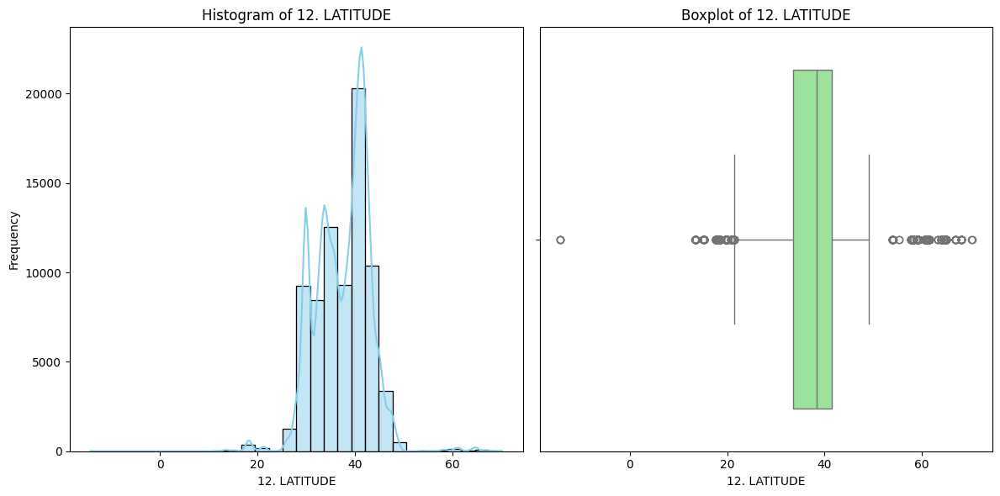

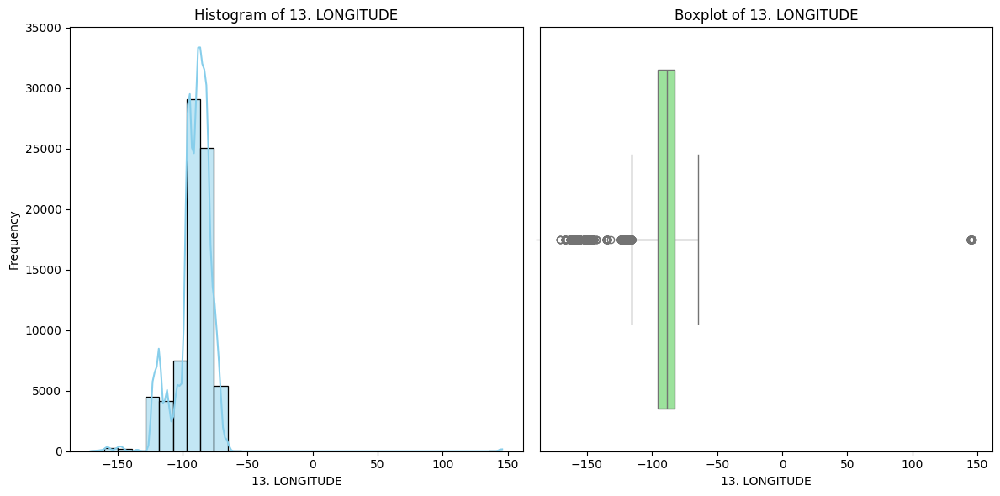

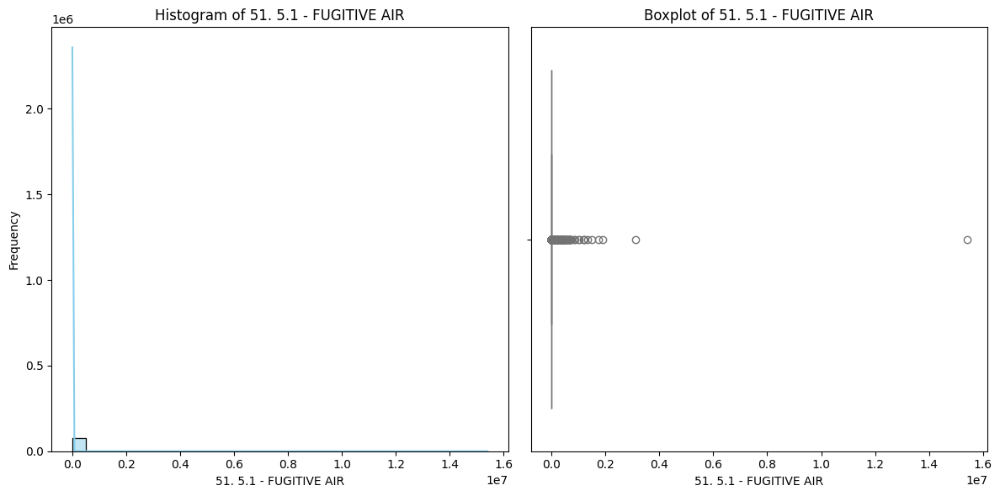

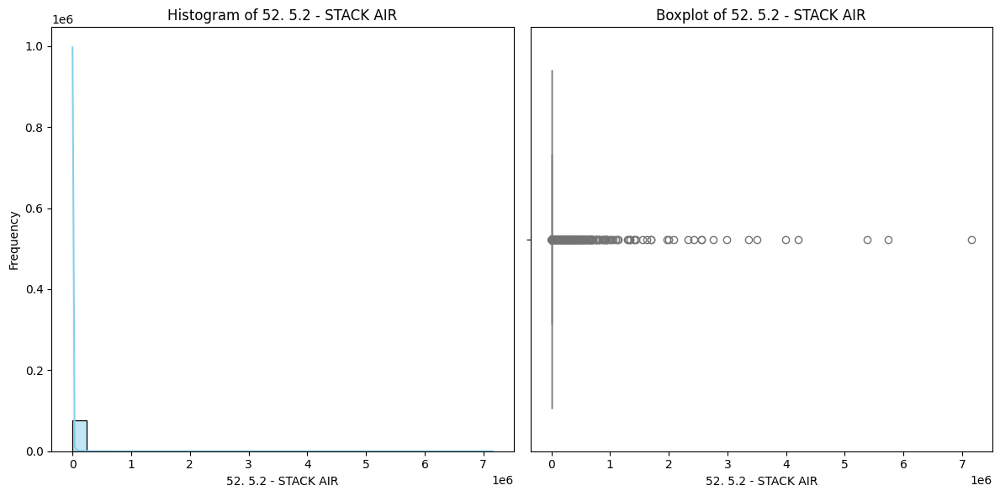

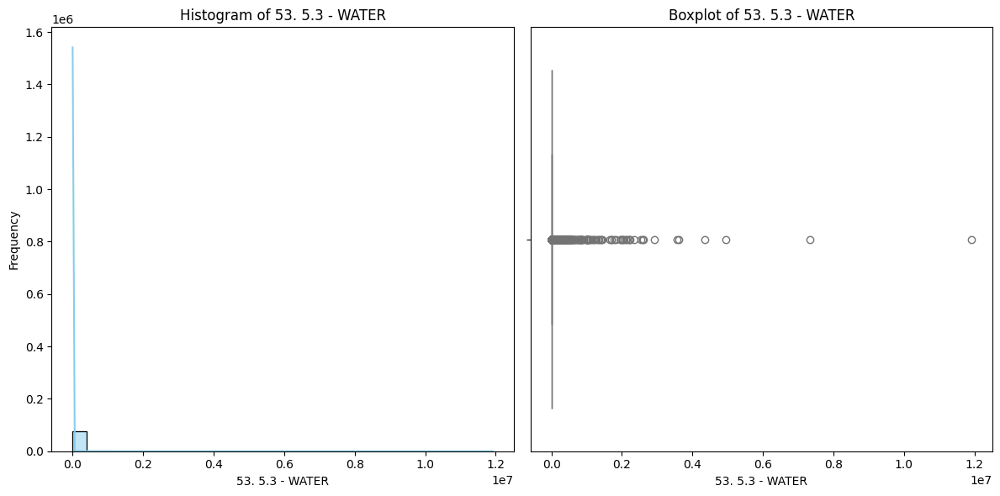

...

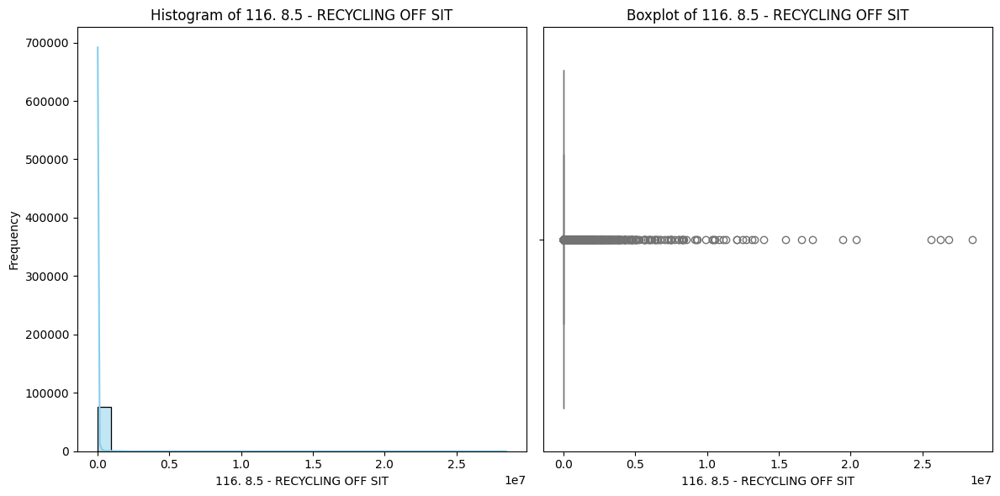

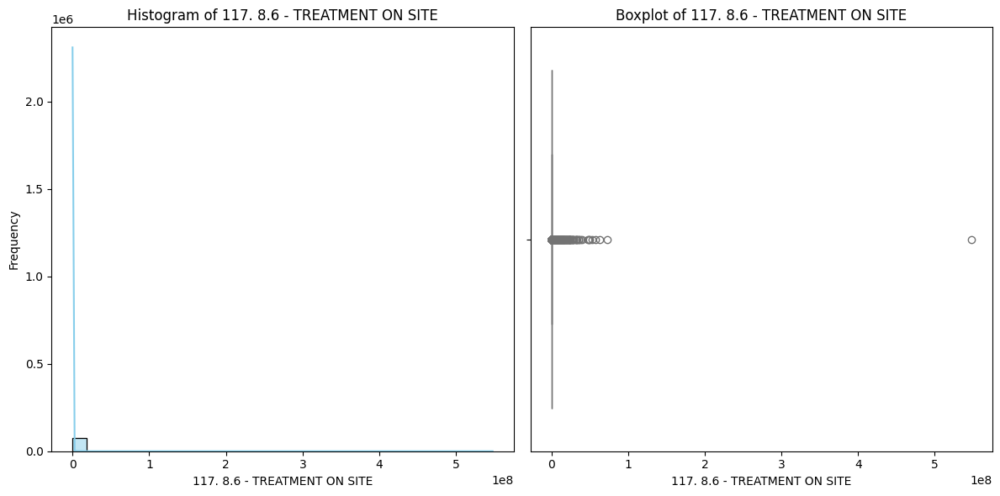

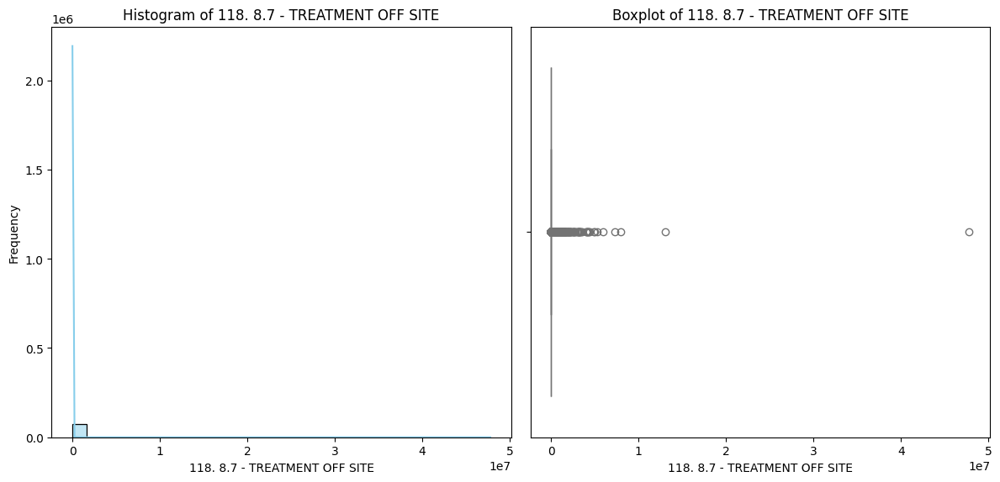

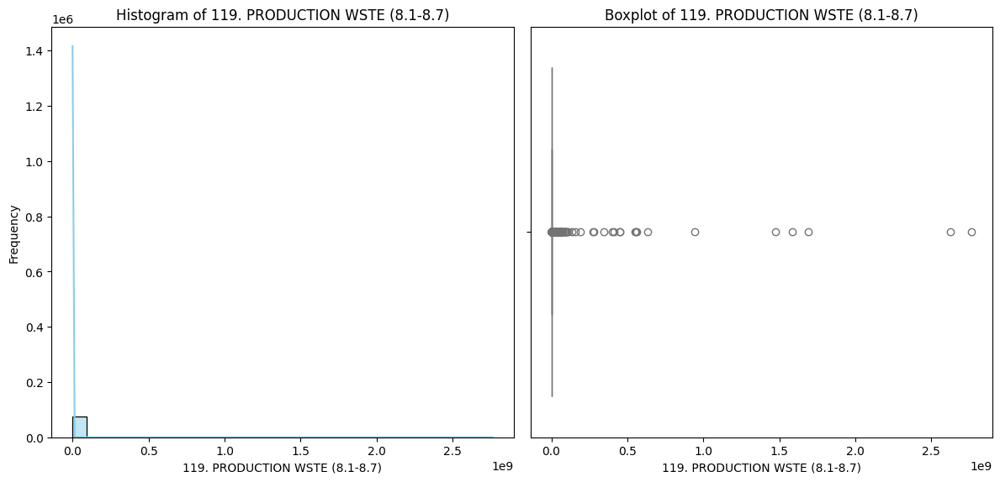

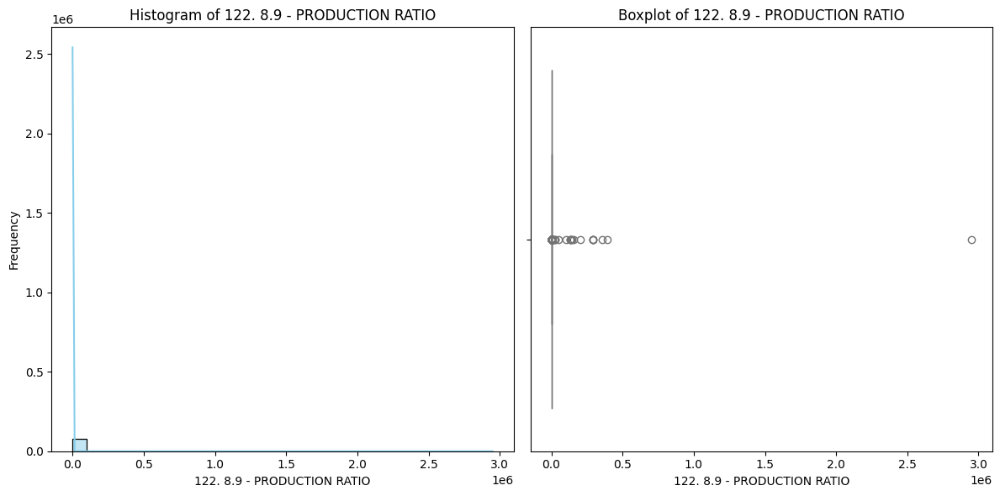

In [ ]:
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_columns:
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.histplot(df[col], bins=30, kde=True, color='skyblue')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col], color='lightgreen')
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

    plt.tight_layout()
    plt.show()

Anggap dulu outlier ini memang wajar di data, karena kalau dilihat hampir semua kolom memiliki outlier yang signifikan

## Jumlah Nilai Unik ST

In [ ]:
# Menghitung jumlah baris untuk setiap kategori
df['8. ST'].value_counts()

,count
8. ST,
TX,9295
OH,4676
IL,3407
CA,3386
PA,3316
IN,3233
MI,2894
LA,2871
WI,2613


# Data 10 State US berdasarkan kepadatan penduduk (9943 baris)

10 State US

- District of Columbia - DC
- New Jersey - NJ
- Rhode Island - RI
- Massachusetts - MA
- Connecticut - CT
- Maryland - MD
- Delaware - DE
- Florida - FL
- New York - NY
- Pennsylvania - PA

In [ ]:
# Daftar singkatan negara bagian yang diinginkan
state_abbreviations = [
    'DC', 'NJ', 'RI', 'MA', 'CT',
    'MD', 'DE', 'FL', 'NY', 'PA'
]

# Filter DataFrame berdasarkan nilai kolom '8. ST'
df_10 = df[df['8. ST'].isin(state_abbreviations)]
print(f"Jumlah data setelah filter: {len(df_10)}")

Jumlah data setelah filter: 9943


In [ ]:
df_10.head()

,2. TRIFD,6. CITY,7. COUNTY,8. ST,9. ZIP,12. LATITUDE,13. LONGITUDE,14. HORIZONTAL DATUM,21. FEDERAL FACILITY,23. INDUSTRY SECTOR,30. PRIMARY NAICS,37. CHEMICAL,38. ELEMENTAL METAL INCLUDED,39. TRI CHEMICAL/COMPOUND ID,42. CLEAN AIR ACT CHEMICAL,43. CLASSIFICATION,44. METAL,45. METAL CATEGORY,46. CARCINOGEN,47. PBT,48. PFAS,49. FORM TYPE,50. UNIT OF MEASURE,51. 5.1 - FUGITIVE AIR,52. 5.2 - STACK AIR,53. 5.3 - WATER,55. 5.4.1 - UNDERGROUND CL I,56. 5.4.2 - UNDERGROUND C II-V,58. 5.5.1A - RCRA C LANDFILL,59. 5.5.1B - OTHER LANDFILLS,60. 5.5.2 - LAND TREATMENT,62. 5.5.3A - RCRA SURFACE IM,63. 5.5.3B - OTHER SURFACE I,64. 5.5.4 - OTHER DISPOSAL,66. 6.1 - POTW - TRNS RLSE,67. 6.1 - POTW - TRNS TRT,68. POTW - TOTAL TRANSFERS,69. 6.2 - M10,70. 6.2 - M41,71. 6.2 - M62,75. 6.2 - M81,76. 6.2 - M82,79. 6.2 - M66,80. 6.2 - M67,81. 6.2 - M64,82. 6.2 - M65,83. 6.2 - M73,84. 6.2 - M79,85. 6.2 - M90,86. 6.2 - M94,87. 6.2 - M99,89. 6.2 - M20,90. 6.2 - M24,91. 6.2 - M26,92. 6.2 - M28,93. 6.2 - M93,94. OFF-SITE RECYCLED TOTAL,95. 6.2 - M56,96. 6.2 - M92,97. OFF-SITE ENERGY RECOVERY T,98. 6.2 - M40 NON-METAL,99. 6.2 - M50,100. 6.2 - M54,101. 6.2 - M61 NON-METAL,102. 6.2 - M69,103. 6.2 - M95,104. OFF-SITE TREATED TOTAL,106. 6.2 - TOTAL TRANSFER,107. TOTAL RELEASES,109. 8.1A - ON-SITE CONTAINED,110. 8.1B - ON-SITE OTHER,111. 8.1C - OFF-SITE CONTAIN,112. 8.1D - OFF-SITE OTHER R,113. 8.2 - ENERGY RECOVER ON,114. 8.3 - ENERGY RECOVER OF,115. 8.4 - RECYCLING ON SITE,116. 8.5 - RECYCLING OFF SIT,117. 8.6 - TREATMENT ON SITE,118. 8.7 - TREATMENT OFF SITE,119. PRODUCTION WSTE (8.1-8.7),121. PROD_RATIO_OR_ ACTIVITY,122. 8.9 - PRODUCTION RATIO
1,21922WLGRS1320A,ELKTON,CECIL,MD,21921,39.664033,-75.807412,NAD83,NO,Chemicals,325211,N-Methyl-2-pyrrolidone,NO,872504,NO,TRI,NO,Non_Metal,NO,NO,NO,R,Pounds,1154.76,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,384841.0,0.0,0.0,0.0,0.0,384841.0,0.0,434155.0,434155.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,818996.0,1154.76,0.0,1154.76,0.0,0.0,0.0,434155.0,0.0,384841.0,0.0,0.0,820150.76,ACTIVITY,1.49
5,1773WCHMPN356BA,HUGHESVILLE,LYCOMING,PA,17737,41.227120,-76.728960,NAD83,NO,Chemical Wholesalers,424690,Methanol,NO,67561,YES,TRI,NO,Non_Metal,NO,NO,NO,R,Pounds,915.90,764.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1680.20,0.0,1680.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1680.20,PRODUCTION,1.26
37,32055PRNML1575L,LAKE CITY,COLUMBIA,FL,32055,30.195600,-82.650690,NAD83,NO,Food,311119,Manganese compounds,NO,N450,YES,TRI,YES,Metal complound categories,NO,NO,NO,A,Pounds,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,PRODUCTION,0.00
44,32177SHFFLCOMFO,PALATKA,PUTNAM,FL,32177,29.692523,-81.654742,NAD83,NO,Fabricated Metals,332312,Nickel,NO,7440020,YES,TRI,YES,Elemental metals,YES,NO,NO,R,Pounds,0.92,15.9,22.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35.2,0.0,0.0,0.0,0.0,0.0,28.1,0.0,28298.0,0.0,0.0,0.0,28298.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28361.3,118.62,0.0,55.32,35.2,28.1,0.0,0.0,0.0,28298.0,0.0,0.0,28416.62,PRODUCTION,1.24
51,0605WSHRTP29IND,NEW HARTFORD,LITCHFIELD,CT,6057,41.881690,-72.974700,NAD83,NO,Paper,322220,Propylene,NO,115071,NO,TRI,NO,Non_Metal,NO,NO,NO,A,Pounds,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,PRODUCTION,0.00


## Deskripsi Data df_10

In [ ]:
df_10.describe()

,12. LATITUDE,13. LONGITUDE,51. 5.1 - FUGITIVE AIR,52. 5.2 - STACK AIR,53. 5.3 - WATER,55. 5.4.1 - UNDERGROUND CL I,56. 5.4.2 - UNDERGROUND C II-V,58. 5.5.1A - RCRA C LANDFILL,59. 5.5.1B - OTHER LANDFILLS,60. 5.5.2 - LAND TREATMENT,62. 5.5.3A - RCRA SURFACE IM,63. 5.5.3B - OTHER SURFACE I,64. 5.5.4 - OTHER DISPOSAL,66. 6.1 - POTW - TRNS RLSE,67. 6.1 - POTW - TRNS TRT,68. POTW - TOTAL TRANSFERS,69. 6.2 - M10,70. 6.2 - M41,71. 6.2 - M62,75. 6.2 - M81,76. 6.2 - M82,79. 6.2 - M66,80. 6.2 - M67,81. 6.2 - M64,82. 6.2 - M65,83. 6.2 - M73,84. 6.2 - M79,85. 6.2 - M90,86. 6.2 - M94,87. 6.2 - M99,89. 6.2 - M20,90. 6.2 - M24,91. 6.2 - M26,92. 6.2 - M28,93. 6.2 - M93,94. OFF-SITE RECYCLED TOTAL,95. 6.2 - M56,96. 6.2 - M92,97. OFF-SITE ENERGY RECOVERY T,98. 6.2 - M40 NON-METAL,99. 6.2 - M50,100. 6.2 - M54,101. 6.2 - M61 NON-METAL,102. 6.2 - M69,103. 6.2 - M95,104. OFF-SITE TREATED TOTAL,106. 6.2 - TOTAL TRANSFER,107. TOTAL RELEASES,109. 8.1A - ON-SITE CONTAINED,110. 8.1B - ON-SITE OTHER,111. 8.1C - OFF-SITE CONTAIN,112. 8.1D - OFF-SITE OTHER R,113. 8.2 - ENERGY RECOVER ON,114. 8.3 - ENERGY RECOVER OF,115. 8.4 - RECYCLING ON SITE,116. 8.5 - RECYCLING OFF SIT,117. 8.6 - TREATMENT ON SITE,118. 8.7 - TREATMENT OFF SITE,119. PRODUCTION WSTE (8.1-8.7),122. 8.9 - PRODUCTION RATIO
count,9943.000000,9943.000000,9943.000000,9943.000000,9.943000e+03,9.943000e+03,9943.000000,9943.000000,9.943000e+03,9943.000000,9943.000000,9.943000e+03,9.943000e+03,9943.000000,9.943000e+03,9.943000e+03,9943.000000,9943.000000,9943.000000,9943.000000,9943.000000,9943.000000,9943.000000,9.943000e+03,9943.000000,9943.000000,9943.000000,9943.000000,9943.000000,9943.000000,9.943000e+03,9.943000e+03,9.943000e+03,9943.000000,9.943000e+03,9.943000e+03,9.943000e+03,9943.000000,9.943000e+03,9943.000000,9.943000e+03,9943.000000,9.943000e+03,9943.000000,9943.000000,9.943000e+03,9.943000e+03,9.943000e+03,9.943000e+03,9.943000e+03,9.943000e+03,9943.000000,9.943000e+03,9.943000e+03,9.943000e+03,9.943000e+03,9.943000e+03,9.943000e+03,9.943000e+03,9943.000000
mean,38.886942,-76.803862,852.197034,2355.623363,1.803291e+03,1.776119e+03,2.766488,1.914543,1.173769e+03,72.259562,0.043370,2.219611e+02,1.885261e+02,437.916319,3.293799e+03,3.731715e+03,50.453076,640.394452,54.889557,29.367507,0.689347,2.282626,0.035241,1.690841e+03,381.706897,67.764823,234.892197,305.046188,102.081404,89.787802,1.225399e+03,1.574384e+04,1.771021e+03,7.653726,4.714459e+03,2.346237e+04,3.332602e+03,506.986876,3.834264e+03,114.299891,2.214496e+03,239.780528,8.944632e+02,152.134768,122.680890,7.031655e+03,3.842177e+04,1.253662e+04,2.951791e+03,5.494821e+03,2.106308e+03,1978.890450,1.775229e+04,3.834264e+03,4.542771e+05,2.345939e+04,3.365914e+04,7.031119e+03,5.525451e+05,3.536498
std,5.001290,3.531487,12713.991499,21144.641518,6.179070e+04,1.390450e+05,228.783505,115.341368,4.636685e+04,2262.501451,4.282394,1.746116e+04,1.097014e+04,8297.773422,6.998188e+04,7.729813e+04,1845.199521,14901.662241,3403.183324,1207.987459,50.666398,212.865952,3.510020,3.862554e+04,12974.963557,1975.307884,5999.528686,6062.526732,1639.448536,1803.495004,4.864584e+04,1.799587e+05,2.735484e+04,760.684919,5.851559e+04,1.975178e+05,4.743856e+04,11234.594264,4.883979e+04,4993.158844,4.804784e+04,12255.252857,2.429219e+04,6550.370409,4726.881141,9.069980e+04,2.367688e+05,1.689883e+05,1.465579e+05,7.042276e+04,4.077139e+04,20025.770094,6.541341e+05,4.883979e+04,2.901238e+07,1.975187e+05,6.171739e+05,9.070031e+04,2.903301e+07,237.980511
min,24.562950,-87.333323,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00

## Label Encoding df_10

In [ ]:
# Memilih kolom-kolom dengan tipe data kategori (object atau category)
categorical_columns = df_10.select_dtypes(include=['object', 'category']).columns
for column in categorical_columns:
    unique_count = df_10[column].nunique()
    print(f"Jumlah Nilai Unik dari '{column}': {unique_count}")

Jumlah Nilai Unik dari '2. TRIFD': 3525
Jumlah Nilai Unik dari '6. CITY': 1321
Jumlah Nilai Unik dari '7. COUNTY': 208
Jumlah Nilai Unik dari '8. ST': 10
Jumlah Nilai Unik dari '9. ZIP': 1713
Jumlah Nilai Unik dari '14. HORIZONTAL DATUM': 1
Jumlah Nilai Unik dari '21. FEDERAL FACILITY': 2
Jumlah Nilai Unik dari '23. INDUSTRY SECTOR': 29
Jumlah Nilai Unik dari '30. PRIMARY NAICS': 312
Jumlah Nilai Unik dari '37. CHEMICAL': 270
Jumlah Nilai Unik dari '38. ELEMENTAL METAL INCLUDED': 2
Jumlah Nilai Unik dari '39. TRI CHEMICAL/COMPOUND ID': 256
Jumlah Nilai Unik dari '42. CLEAN AIR ACT CHEMICAL': 2
Jumlah Nilai Unik dari '43. CLASSIFICATION': 3
Jumlah Nilai Unik dari '44. METAL': 2
Jumlah Nilai Unik dari '45. METAL CATEGORY': 6
Jumlah Nilai Unik dari '46. CARCINOGEN': 2
Jumlah Nilai Unik dari '47. PBT': 2
Jumlah Nilai Unik dari '48. PFAS': 2
Jumlah Nilai Unik dari '49. FORM TYPE': 2
Jumlah Nilai Unik dari '50. UNIT OF MEASURE': 2
Jumlah Nilai Unik dari '121. PROD_RATIO_OR_ ACTIVITY': 2


In [ ]:
df_10_encoded = df_10.copy()
label_encoder = LabelEncoder()
categorical_columns = df_10_encoded.select_dtypes(include=['object']).columns

# Menerapkan Label Encoding
for col in categorical_columns:
    df_10_encoded[col] = label_encoder.fit_transform(df_10_encoded[col])

### Notes

Final Data sebelum Encoding: df_10

Final Data setelah Encoding: df_10_encoded

In [ ]:
df_10.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9943 entries, 1 to 77955
Data columns (total 82 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   2. TRIFD                        9943 non-null   object 
 1   6. CITY                         9943 non-null   object 
 2   7. COUNTY                       9943 non-null   object 
 3   8. ST                           9943 non-null   object 
 4   9. ZIP                          9943 non-null   object 
 5   12. LATITUDE                    9943 non-null   float64
 6   13. LONGITUDE                   9943 non-null   float64
 7   14. HORIZONTAL DATUM            9943 non-null   object 
 8   21. FEDERAL FACILITY            9943 non-null   object 
 9   23. INDUSTRY SECTOR             9943 non-null   object 
 10  30. PRIMARY NAICS               9943 non-null   object 
 11  37. CHEMICAL                    9943 non-null   object 
 12  38. ELEMENTAL METAL INCLUDED    9943 n

In [ ]:
df_10_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9943 entries, 1 to 77955
Data columns (total 82 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   2. TRIFD                        9943 non-null   int64  
 1   6. CITY                         9943 non-null   int64  
 2   7. COUNTY                       9943 non-null   int64  
 3   8. ST                           9943 non-null   int64  
 4   9. ZIP                          9943 non-null   int64  
 5   12. LATITUDE                    9943 non-null   float64
 6   13. LONGITUDE                   9943 non-null   float64
 7   14. HORIZONTAL DATUM            9943 non-null   int64  
 8   21. FEDERAL FACILITY            9943 non-null   int64  
 9   23. INDUSTRY SECTOR             9943 non-null   int64  
 10  30. PRIMARY NAICS               9943 non-null   int64  
 11  37. CHEMICAL                    9943 non-null   int64  
 12  38. ELEMENTAL METAL INCLUDED    9943 n

# Feature Engineering

In [ ]:
# Sebelum Feature Engineering

# Pilih fitur (X) dan target (y)
X_encoded = df_10_encoded.drop(columns=['107. TOTAL RELEASES'])  # Semua fitur kecuali target
y = df_10_encoded['107. TOTAL RELEASES']  # Target variabel

mi_scores = mutual_info_regression(X_encoded, y, random_state=42)
mi_df = pd.DataFrame({
    'Feature': X_encoded.columns,
    'Mutual Information': mi_scores
}).sort_values(by='Mutual Information', ascending=False)

mi_df

,Feature,Mutual Information
69,110. 8.1B - ON-SITE OTHER,2.723042
24,52. 5.2 - STACK AIR,1.065085
78,119. PRODUCTION WSTE (8.1-8.7),0.769078
23,51. 5.1 - FUGITIVE AIR,0.607419
71,112. 8.1D - OFF-SITE OTHER R,0.505030
67,106. 6.2 - TOTAL TRANSFER,0.418671
70,111. 8.1C - OFF-SITE CONTAIN,0.375115
44,81. 6.2 - M64,0.287448
10,30. PRIMARY NAICS,0.279949
11,37. CHEMICAL,0.276560


## Geographical Features

1. Mengelompokkan lokasi geografis berdasarkan kawasan (region).
2. Menghitung jarak dari titik referensi (misalnya, pusat geografis).

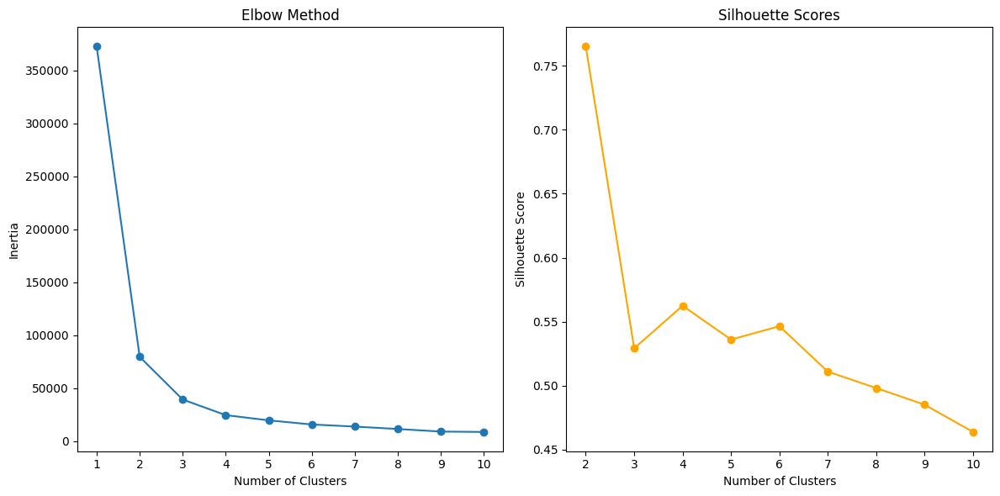

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Data latitude dan longitude untuk clustering
geo_data = df_10_encoded[['12. LATITUDE', '13. LONGITUDE']]

# Menentukan jumlah kluster optimal menggunakan Elbow Method
inertia = []
silhouette_scores = []
k_values = range(1, 11)  # Jumlah kluster dari 1 hingga 10

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(geo_data)
    inertia.append(kmeans.inertia_)
    if k > 1:
        silhouette_scores.append(silhouette_score(geo_data, kmeans.labels_))

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(k_values, inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(k_values)

plt.subplot(1, 2, 2)
plt.plot(range(2, 11), silhouette_scores, marker='o', color='orange')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(range(2, 11))

plt.tight_layout()
plt.show()

Dipilih k=3

In [ ]:
from sklearn.cluster import KMeans
from geopy.distance import geodesic

df_10_geo = df_10_encoded.copy()

# 1. Mengelompokkan lokasi geografis berdasarkan kawasan menggunakan K-Means
# Jumlah cluster dapat disesuaikan sesuai kebutuhan
num_clusters = 3  # Mengelompokkan menjadi 3 region
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
df_10_geo['Region'] = kmeans.fit_predict(df_10_geo[['12. LATITUDE', '13. LONGITUDE']])

# 2. Menghitung jarak dari titik referensi (misalnya, pusat geografis tertentu)
# Titik referensi (latitude, longitude), contohnya adalah pusat geografis Amerika Serikat
reference_point = (39.8283, -98.5795)  # Latitude dan Longitude untuk pusat geografis AS

def calculate_distance(lat, lon):
    return geodesic((lat, lon), reference_point).kilometers

df_10_geo['Distance_From_Center'] = df_10_geo.apply(
    lambda row: calculate_distance(row['12. LATITUDE'], row['13. LONGITUDE']), axis=1
)

print(df_10_geo[['12. LATITUDE', '13. LONGITUDE', 'Region', 'Distance_From_Center']].head())

    12. LATITUDE  13. LONGITUDE  Region  Distance_From_Center
1      39.664033     -75.807412       0           1946.563937
5      41.227120     -76.728960       2           1853.059287
37     30.195600     -82.650690       1           1799.730063
44     29.692523     -81.654742       1           1909.005229
51     41.881690     -72.974700       0           2162.888319


In [ ]:
import folium

geo_data['Cluster'] = KMeans(n_clusters=3, random_state=42).fit_predict(geo_data)
map_clusters = folium.Map(location=[geo_data['12. LATITUDE'].mean(), geo_data['13. LONGITUDE'].mean()], zoom_start=5)

cluster_colors = {0: 'red', 1: 'blue', 2: 'green'}
geo_data.apply(lambda row: folium.CircleMarker(
    location=[row['12. LATITUDE'], row['13. LONGITUDE']],
    radius=5,
    color=cluster_colors[row['Cluster']],
    fill=True,
    fill_color=cluster_colors[row['Cluster']],
    fill_opacity=0.7
).add_to(map_clusters), axis=1)

map_clusters.save('map_clusters.html')
print("Peta clustering disimpan sebagai 'map_clusters.html'")

<ipython-input-33-c98edae70f07>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_data['Cluster'] = KMeans(n_clusters=3, random_state=42).fit_predict(geo_data)


Peta clustering disimpan sebagai 'map_clusters.html'


In [ ]:
import folium
from IPython.display import display

# Menampilkan peta langsung di Colab
display(map_clusters)

                           Feature  Mutual Information
69       110. 8.1B - ON-SITE OTHER            2.720000
24             52. 5.2 - STACK AIR            1.069410
78  119. PRODUCTION WSTE (8.1-8.7)            0.763135
23          51. 5.1 - FUGITIVE AIR            0.594269
71    112. 8.1D - OFF-SITE OTHER R            0.516482
67       106. 6.2 - TOTAL TRANSFER            0.425262
70    111. 8.1C - OFF-SITE CONTAIN            0.377233
44                   81. 6.2 - M64            0.293909
11                    37. CHEMICAL            0.283360
10               30. PRIMARY NAICS            0.276872
13    39. TRI CHEMICAL/COMPOUND ID            0.271997
80     122. 8.9 - PRODUCTION RATIO            0.222076
0                         2. TRIFD            0.220271
4                           9. ZIP            0.215013
6                    13. LONGITUDE            0.210534
82            Distance_From_Center            0.196557
21                   49. FORM TYPE            0.194713
5         

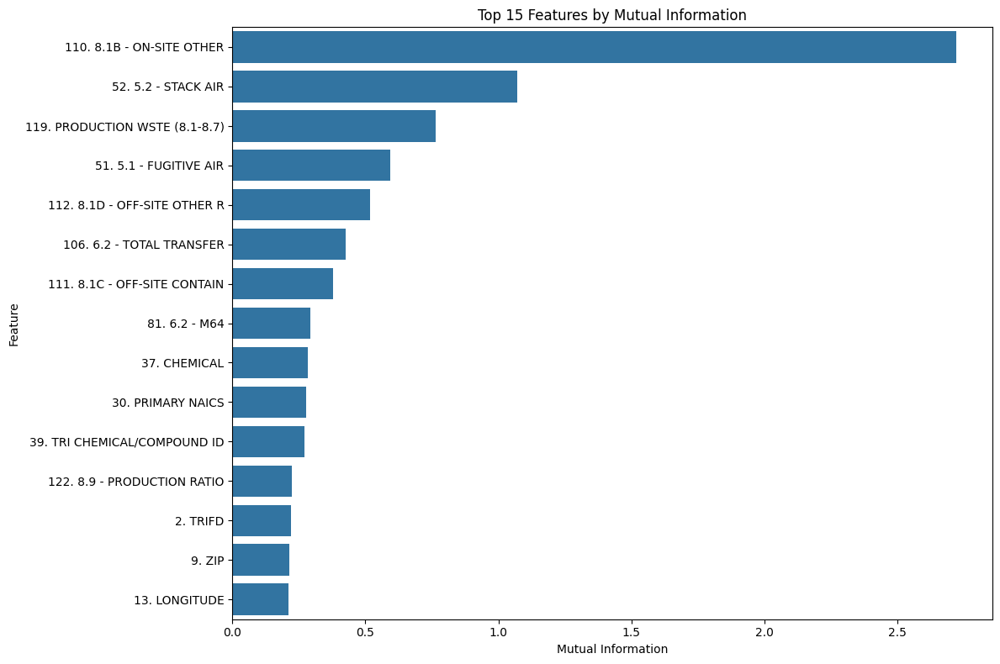

In [ ]:
# Pilih fitur (X) dan target (y)
X_encoded = df_10_geo.drop(columns=['107. TOTAL RELEASES'])  # Semua fitur kecuali target
y = df_10_geo['107. TOTAL RELEASES']  # Target variabel

# Hitung Mutual Information (MI) untuk regresi
mi_scores = mutual_info_regression(X_encoded, y, random_state=42)

mi_df = pd.DataFrame({
    'Feature': X_encoded.columns,
    'Mutual Information': mi_scores
}).sort_values(by='Mutual Information', ascending=False)

print(mi_df)

plt.figure(figsize=(12, 8))
sns.barplot(
    data=mi_df.head(15),  # Hanya 15 fitur teratas
    x='Mutual Information',
    y='Feature'
)
plt.title('Top 15 Features by Mutual Information')
plt.xlabel('Mutual Information')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

In [ ]:
df_10_enco1 = df_10_geo.copy()

## Indikator Risiko

Variabel CARCINOGEN, PBT (Persistent Bioaccumulative Toxic), dan PFAS (Per- and Polyfluoroalkyl Substances) adalah indikator penting dari bahan kimia yang berbahaya bagi kesehatan manusia dan lingkungan.

In [ ]:
df_10_enco2 = df_10_enco1.copy()
df_10_enco2['Environmental_Risk_Score'] = (
    df_10_enco1['46. CARCINOGEN'] +  # Karsinogen
    df_10_enco1['47. PBT'] +         # Persistent Bioaccumulative Toxic
    df_10_enco1['48. PFAS']          # Per- and Polyfluoroalkyl Substances
)

## Efisiensi Daur Ulang (Recycling) dan Pengolahan (Treatment)

1. **Efisiensi Daur Ulang (Recycling Efficiency)**

- **Definisi**: Rasio antara limbah yang didaur ulang (on-site dan off-site) dengan total limbah.
- **Formula**:
Recycling_Efficiency = (8.4 - RECYCLING ON SITE + 8.5 - RECYCLING OFF SITE) / PRODUCTION WSTE (8.1-8.7)
2. **Efisiensi Pengolahan (Treatment Efficiency)**

- **Definisi**: Rasio antara limbah yang diolah (on-site dan off-site) dengan total limbah.
- **Formula**:
Treatment_Efficiency = (8.6 - TREATMENT ON SITE + 8.7 - TREATMENT OFF SITE) / PRODUCTION WSTE (8.1-8.7)
---

**Mengapa Fitur Ini Penting?**

1. **Hubungan Langsung dengan TOTAL RELEASES (107)**:
   - Limbah yang dikelola dengan baik melalui daur ulang atau pengolahan cenderung mengurangi jumlah pelepasan total ke lingkungan.

2. **Recycling Efficiency**:
   - Mengukur **proporsi limbah yang berhasil didaur ulang**.
   - Efisiensi yang tinggi menunjukkan bahwa sistem pengelolaan limbah sangat baik dalam memanfaatkan kembali limbah.

3. **Treatment Efficiency**:
   - Mengukur **proporsi limbah yang berhasil diolah** sebelum dilepaskan.
   - Efisiensi tinggi menunjukkan bahwa sistem pengolahan limbah efektif dalam meminimalkan dampak lingkungan sebelum pelepasan terjadi.

---

**Kesimpulan**
Fitur-fitur ini memberikan wawasan penting tentang efisiensi manajemen limbah dan hubungannya dengan **TOTAL RELEASES (107)**, sehingga dapat menjadi prediktor signifikan untuk model.

In [ ]:
df_10_enco3 = df_10_enco2.copy()

# Menambahkan kolom Recycling Efficiency
df_10_enco3['Recycling_Efficiency'] = (
    (df_10_enco3['115. 8.4 - RECYCLING ON SITE'] + df_10_enco3['116. 8.5 - RECYCLING OFF SIT']) /
    df_10_enco3['119. PRODUCTION WSTE (8.1-8.7)']
)

# Menambahkan kolom Treatment Efficiency
df_10_enco3['Treatment_Efficiency'] = (
    (df_10_enco3['117. 8.6 - TREATMENT ON SITE'] + df_10_enco3['118. 8.7 - TREATMENT OFF SITE']) /
    df_10_enco3['119. PRODUCTION WSTE (8.1-8.7)']
)

df_10_enco3['Recycling_Efficiency'].fillna(0, inplace=True)
df_10_enco3['Treatment_Efficiency'].fillna(0, inplace=True)
df_10_enco3['Recycling_Efficiency'].replace([float('inf'), -float('inf')], 0, inplace=True)
df_10_enco3['Treatment_Efficiency'].replace([float('inf'), -float('inf')], 0, inplace=True)

<ipython-input-38-f18ce7c77942>:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_10_enco3['Recycling_Efficiency'].fillna(0, inplace=True)
<ipython-input-38-f18ce7c77942>:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=Tru

# Modeling

## EDA Final Data

Final data adalah: df_final

In [ ]:
df_final = df_10_enco3.copy()

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9943 entries, 1 to 77955
Data columns (total 87 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   2. TRIFD                        9943 non-null   int64  
 1   6. CITY                         9943 non-null   int64  
 2   7. COUNTY                       9943 non-null   int64  
 3   8. ST                           9943 non-null   int64  
 4   9. ZIP                          9943 non-null   int64  
 5   12. LATITUDE                    9943 non-null   float64
 6   13. LONGITUDE                   9943 non-null   float64
 7   14. HORIZONTAL DATUM            9943 non-null   int64  
 8   21. FEDERAL FACILITY            9943 non-null   int64  
 9   23. INDUSTRY SECTOR             9943 non-null   int64  
 10  30. PRIMARY NAICS               9943 non-null   int64  
 11  37. CHEMICAL                    9943 non-null   int64  
 12  38. ELEMENTAL METAL INCLUDED    9943 n

In [ ]:
# Pilih hanya kolom numerik
numerical_columns_df_final = df_final.select_dtypes(include=['float64', 'int']).columns

corr_df_final = df_final[numerical_columns_df_final].corr()

print("Korelasi:")
print(corr_df_final['107. TOTAL RELEASES'].sort_values(ascending=False))

Korelasi:
107. TOTAL RELEASES               1.000000
109. 8.1A - ON-SITE CONTAINED     0.867903
55. 5.4.1 - UNDERGROUND CL I      0.822067
110. 8.1B - ON-SITE OTHER         0.414906
53. 5.3 - WATER                   0.364849
59. 5.5.1B - OTHER LANDFILLS      0.278084
111. 8.1C - OFF-SITE CONTAIN      0.247629
81. 6.2 - M64                     0.233985
52. 5.2 - STACK AIR               0.134829
112. 8.1D - OFF-SITE OTHER R      0.123646
63. 5.5.3B - OTHER SURFACE I      0.104588
70. 6.2 - M41                     0.101028
51. 5.1 - FUGITIVE AIR            0.099544
82. 6.2 - M65                     0.080980
106. 6.2 - TOTAL TRANSFER         0.072184
64. 5.5.4 - OTHER DISPOSAL        0.064023
117. 8.6 - TREATMENT ON SITE      0.052915
66. 6.1 - POTW - TRNS RLSE        0.046871
68. POTW - TOTAL TRANSFERS        0.042153
39. TRI CHEMICAL/COMPOUND ID      0.041331
67. 6.1 - POTW - TRNS TRT         0.041003
9. ZIP                            0.034936
85. 6.2 - M90                     0.034572
8

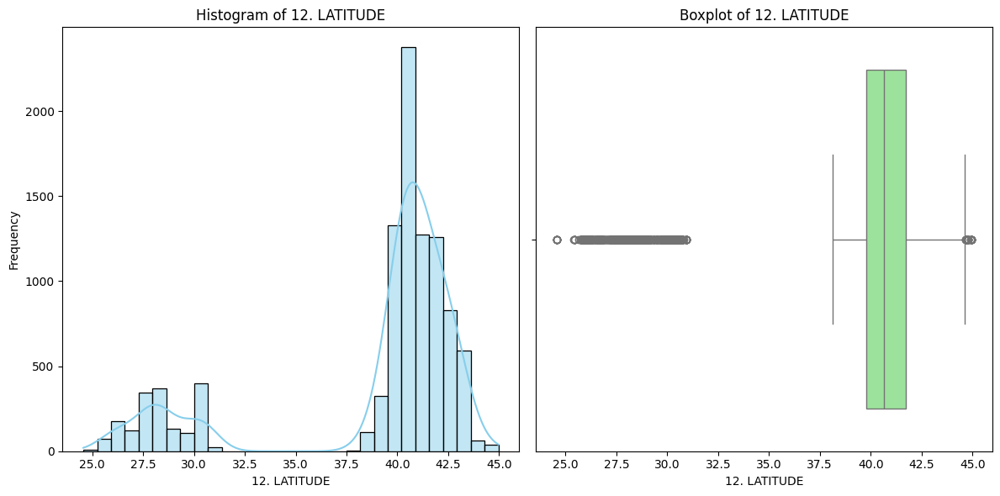

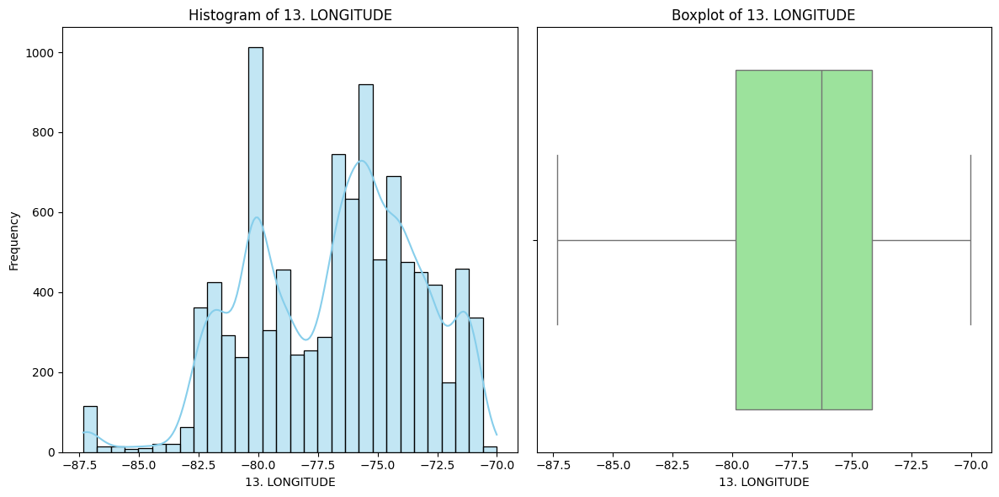

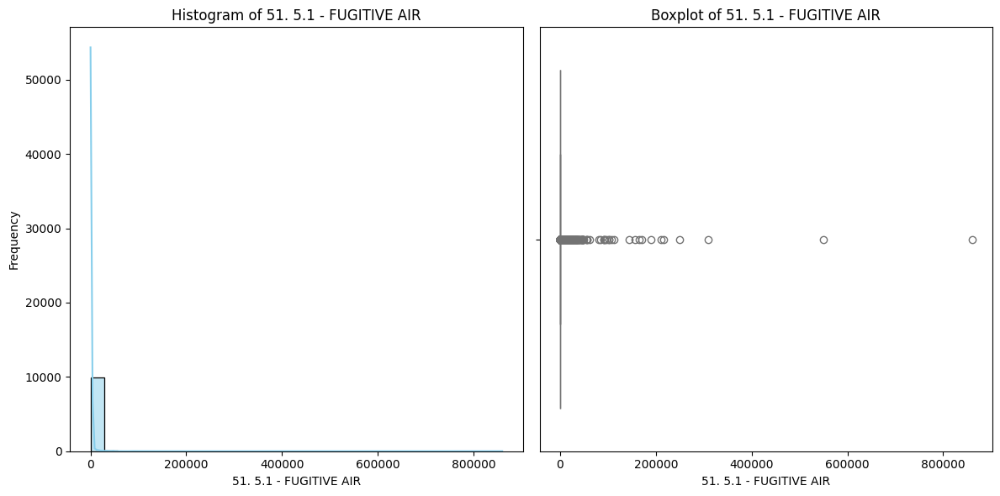

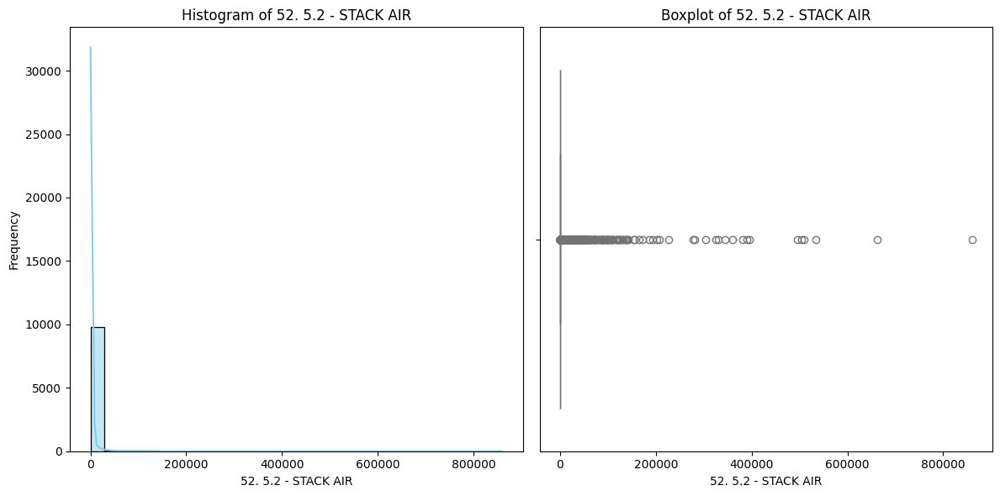

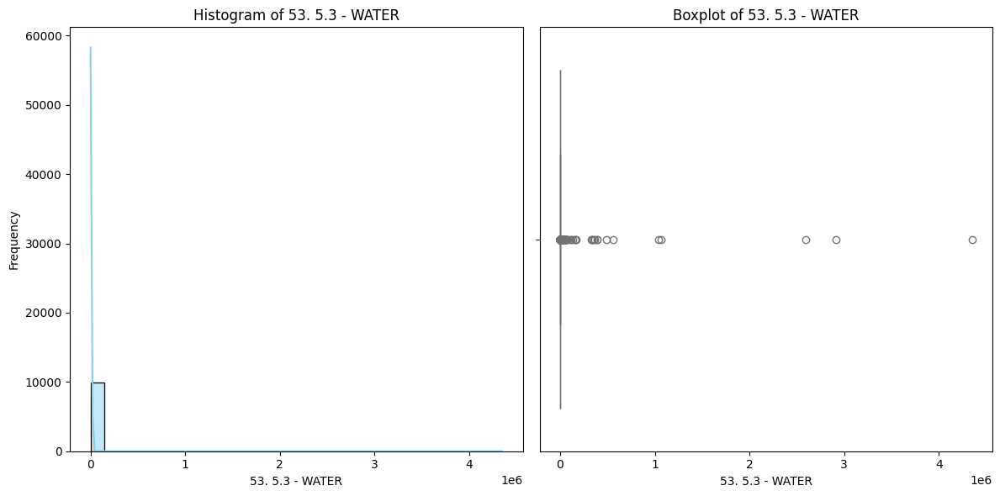

...

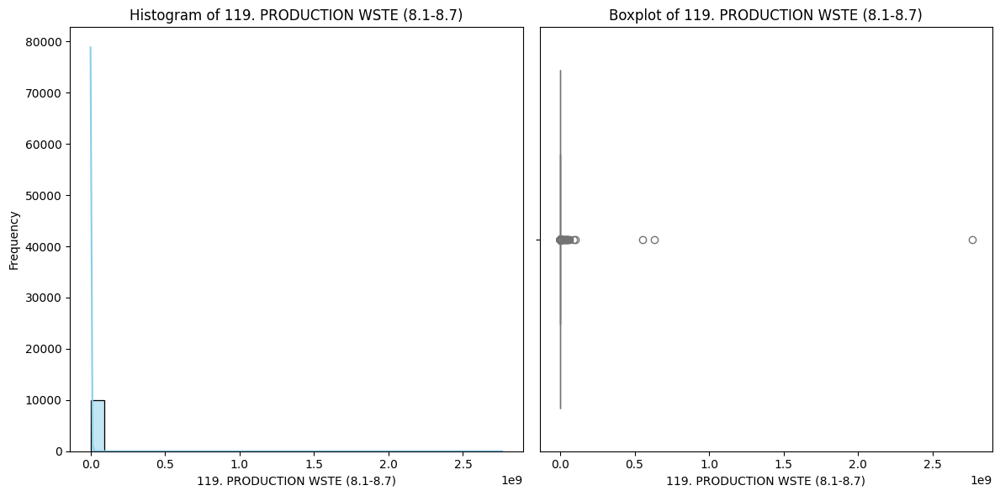

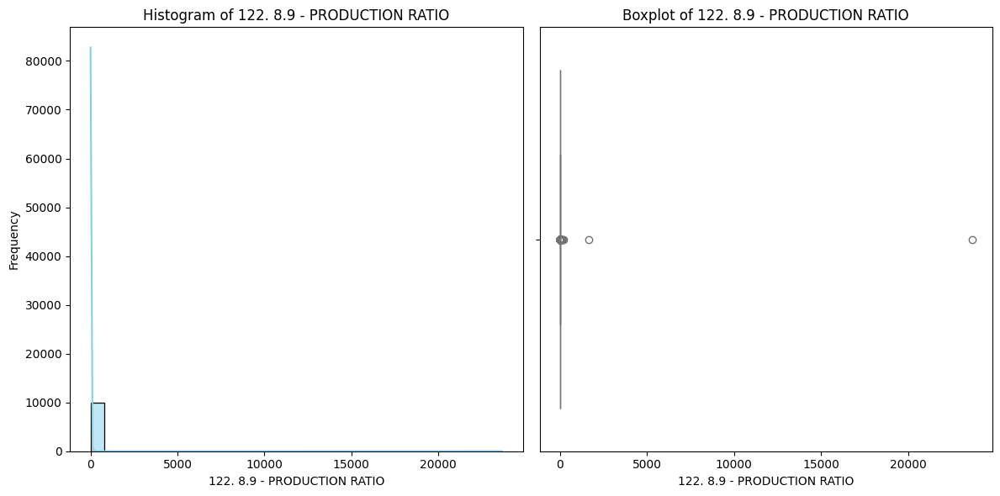

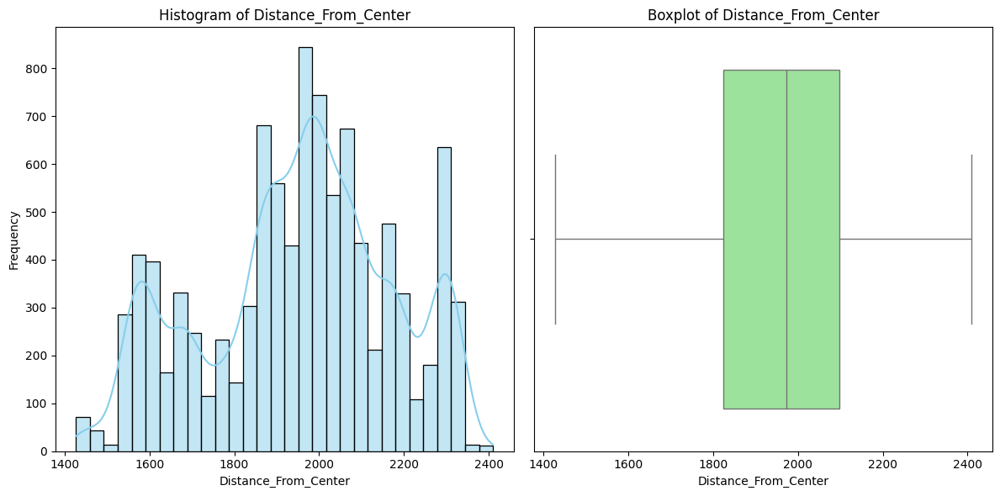

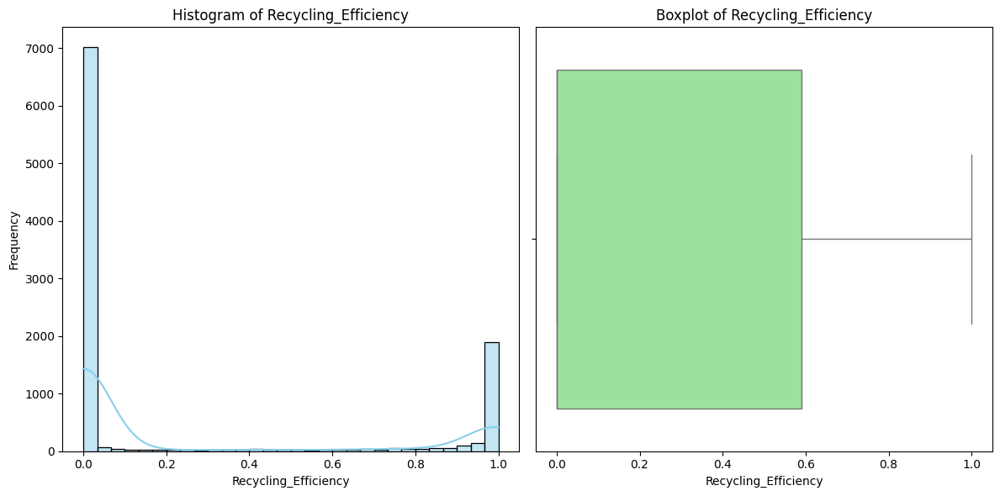

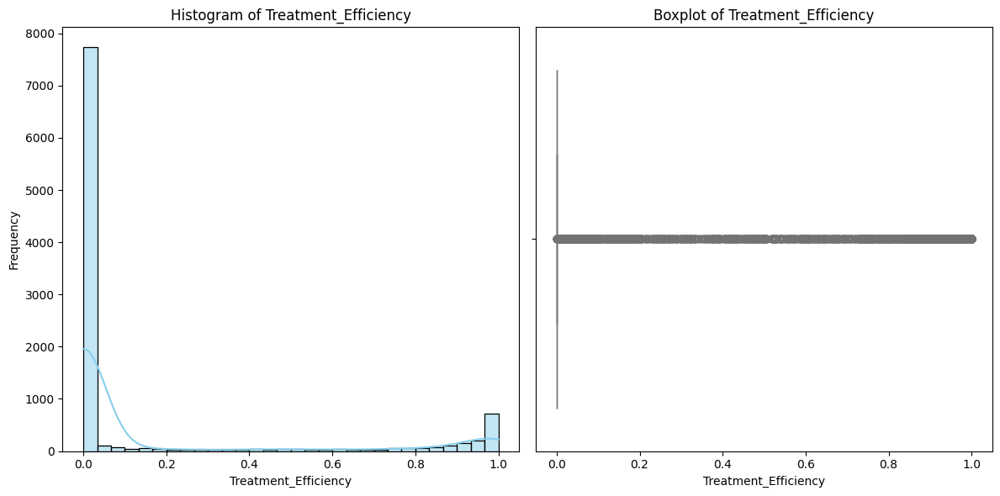

In [ ]:
float_columns = df_final.select_dtypes(include=['float']).columns
for col in float_columns:

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.histplot(df_final[col], bins=30, kde=True, color='skyblue')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_final[col], color='lightgreen')
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

    plt.tight_layout()
    plt.show()

## Feature Selection

Mutual Information, Select KBest, Feature Importance, dan Domain Knowledge

#### Metode 1: Mutual Information

                           Feature  Mutual Information
69       110. 8.1B - ON-SITE OTHER            2.720850
24             52. 5.2 - STACK AIR            1.061441
78  119. PRODUCTION WSTE (8.1-8.7)            0.762994
23          51. 5.1 - FUGITIVE AIR            0.607386
71    112. 8.1D - OFF-SITE OTHER R            0.503158
67       106. 6.2 - TOTAL TRANSFER            0.419066
70    111. 8.1C - OFF-SITE CONTAIN            0.386763
44                   81. 6.2 - M64            0.299965
10               30. PRIMARY NAICS            0.282550
11                    37. CHEMICAL            0.278726
13    39. TRI CHEMICAL/COMPOUND ID            0.259379
0                         2. TRIFD            0.221262
4                           9. ZIP            0.215149
80     122. 8.9 - PRODUCTION RATIO            0.213078
6                    13. LONGITUDE            0.211046
82            Distance_From_Center            0.197837
5                     12. LATITUDE            0.195176
21        

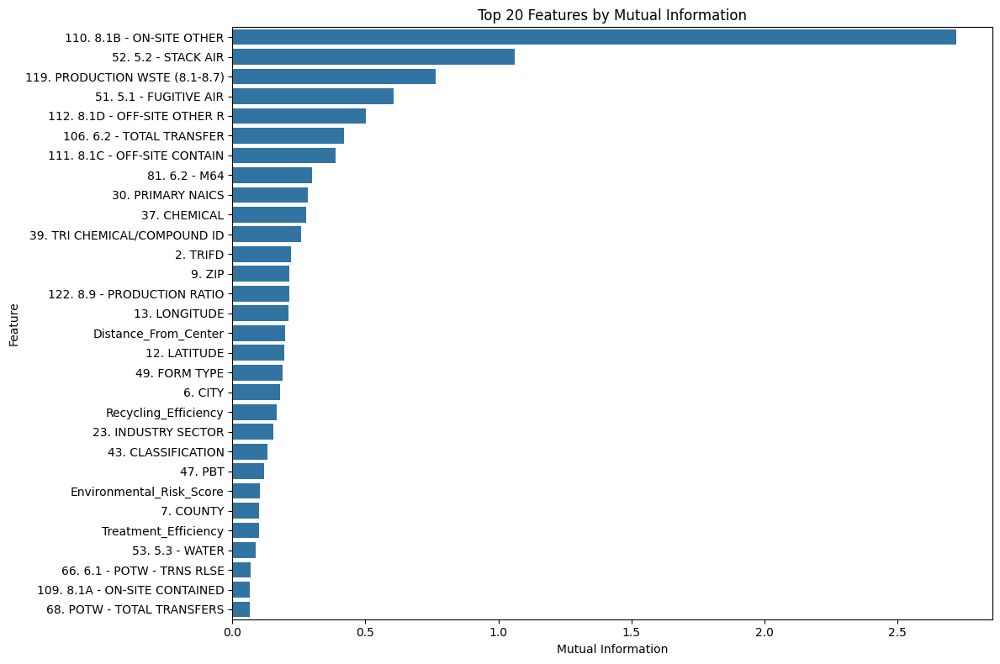

In [ ]:
# Pilih fitur (X) dan target (y)
X_encoded = df_final.drop(columns=['107. TOTAL RELEASES'])  # Semua fitur kecuali target
y = df_final['107. TOTAL RELEASES']  # Target variabel
mi_scores = mutual_info_regression(X_encoded, y, random_state=42)
mi_df = pd.DataFrame({
    'Feature': X_encoded.columns,
    'Mutual Information': mi_scores
}).sort_values(by='Mutual Information', ascending=False)

print(mi_df)

plt.figure(figsize=(12, 8))
sns.barplot(
    data=mi_df.head(30),
    x='Mutual Information',
    y='Feature'
)
plt.title('Top 20 Features by Mutual Information')
plt.xlabel('Mutual Information')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

#### Metode 2: Select K-Best: f_regressor [Top 30]

In [ ]:
X = df_final.copy()
y = X.pop('107. TOTAL RELEASES')

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# Define SelectKBest with f_regression
# Pilih k (jumlah fitur terbaik yang akan dipilih)
k = 30
selector = SelectKBest(score_func=f_regression, k=k)


selector.fit(X, y)
selected_mask = selector.get_support()
selected_columns = X.columns[selected_mask]
X_selected = X[selected_columns]

print("Selected Columns:")
print(selected_columns.tolist())

# Output X_selected berisi fitur-fitur yang terpilih berdasarkan f_regression

Selected Columns:
['9. ZIP', '13. LONGITUDE', '30. PRIMARY NAICS', '39. TRI CHEMICAL/COMPOUND ID', '42. CLEAN AIR ACT CHEMICAL', '46. CARCINOGEN', '51. 5.1 - FUGITIVE AIR', '52. 5.2 - STACK AIR', '53. 5.3 - WATER', '55. 5.4.1 - UNDERGROUND CL I', '59. 5.5.1B - OTHER LANDFILLS', '63. 5.5.3B - OTHER SURFACE I', '64. 5.5.4 - OTHER DISPOSAL', '66. 6.1 - POTW - TRNS RLSE', '67. 6.1 - POTW - TRNS TRT', '68. POTW - TOTAL TRANSFERS', '70. 6.2 - M41', '81. 6.2 - M64', '82. 6.2 - M65', '84. 6.2 - M79', '85. 6.2 - M90', '106. 6.2 - TOTAL TRANSFER', '109. 8.1A - ON-SITE CONTAINED', '110. 8.1B - ON-SITE OTHER', '111. 8.1C - OFF-SITE CONTAIN', '112. 8.1D - OFF-SITE OTHER R', '117. 8.6 - TREATMENT ON SITE', '118. 8.7 - TREATMENT OFF SITE', 'Distance_From_Center', 'Environmental_Risk_Score']


#### Metode 3: Feature Importance

Perlu model selection (dengan semua variabel) terlebih dahulu

In [ ]:
# Membuat daftar nama kolom feature kecuali '107. TOTAL RELEASES'
features = [col for col in df_final.columns if col != '107. TOTAL RELEASES']

X1 = df_final[features]
y1 = df_final['107. TOTAL RELEASES']

# Split data menjadi training dan testing
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2, random_state=42)

models = {
    'Ridge Regression': Ridge(random_state=42),
    'LinearRegression': LinearRegression(),
    'Lasso': Lasso(random_state=42),
    'ElasticNet': ElasticNet(alpha=1.0, l1_ratio=0.5, random_state=42)
}

In [ ]:
def evaluate_model_with_kfold_cv_float_scaling(model, X, y, kf):
    mse_scores = []
    r2_scores = []
    mae_scores = []
    mape_scores = []

    float_columns = X.select_dtypes(include=['float']).columns
    int_columns = X.select_dtypes(include=['int']).columns

    for train_index, val_index in kf.split(X):
        # Split data train dan validation
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        # Scaling hanya pada kolom float
        scaler = RobustScaler()
        X_train_scaled = X_train.copy()
        X_val_scaled = X_val.copy()

        X_train_scaled[float_columns] = scaler.fit_transform(X_train[float_columns])
        X_val_scaled[float_columns] = scaler.transform(X_val[float_columns])

        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_val_scaled)

        mse_scores.append(mean_squared_error(y_val, y_pred))
        r2_scores.append(r2_score(y_val, y_pred))
        mae_scores.append(mean_absolute_error(y_val, y_pred))
        mape_scores.append(mean_absolute_percentage_error(y_val, y_pred))

    metrics = {
        'MSE': np.mean(mse_scores),
        'MSE_std': np.std(mse_scores),
        'RMSE': np.sqrt(np.mean(mse_scores)),
        'RMSE_std': np.std(np.sqrt(np.array(mse_scores))),
        'MAE': np.mean(mae_scores),
        'MAE_std': np.std(mae_scores),
        'MAPE': np.mean(mape_scores),
        'MAPE_std': np.std(mape_scores),
        'R^2': np.mean(r2_scores),
        'R^2_std': np.std(r2_scores)
    }

    return metrics

# KFold cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)

results_kfold = {}
for model_name, model in models.items():
    results_kfold[model_name] = evaluate_model_with_kfold_cv_float_scaling(model, X_train1, y_train1, kf)

df_results_kfold = pd.DataFrame(results_kfold).T
print("Model Evaluation Results (with KFold Cross-Validation and Float Scaling):")
display(df_results_kfold)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=7.81091e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.94008e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.84764e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=4.09848e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarnin

Model Evaluation Results (with KFold Cross-Validation and Float Scaling):


,MSE,MSE_std,RMSE,RMSE_std,MAE,MAE_std,MAPE,MAPE_std,R^2,R^2_std
Ridge Regression,3025.782989,5962.381662,55.007118,47.212870,0.735454,1.238278,1.632129e+11,7.666680e+10,0.999999,0.000001
LinearRegression,2999.267831,5960.112424,54.765572,48.099436,0.656720,1.206290,5.874768e+09,3.974383e+08,0.999999,0.000001
Lasso,70963.755847,140151.860058,266.390232,225.396231,8.659002,8.439382,6.946980e+15,2.682451e+15,0.999987,0.000026
ElasticNet,70248.643356,139927.745745,265.044606,230.522106,6.683868,7.584768,2.113086e+15,4.002452e+14,0.999987,0.000026


Model untuk Feature Importance: Ridge Regression

Setelah melakukan evaluasi model menggunakan **K-Fold Cross-Validation**, kami memutuskan untuk memilih **Ridge Regression** sebagai model untuk mencari feature importance.

---

**Ridge Regression** dipilih sebagai model terbaik karena:
- Performa hampir setara dengan **Linear Regression** namun dengan tambahan regularisasi.
- Keseimbangan antara akurasi prediksi, stabilitas, dan kemampuan generalisasi terhadap data baru.

Ridge Regression akan digunakan untuk mencari informasi dari feature importance lebih lanjut.

Feature Importance Table:


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.36117e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


,Feature,Importance
24,52. 5.2 - STACK AIR,4.750694e+01
23,51. 5.1 - FUGITIVE AIR,5.999930e+00
44,81. 6.2 - M64,9.999996e-01
45,82. 6.2 - M65,9.999996e-01
40,75. 6.2 - M81,9.999996e-01
38,70. 6.2 - M41,9.999996e-01
37,69. 6.2 - M10,9.999996e-01
50,87. 6.2 - M99,9.999996e-01
48,85. 6.2 - M90,9.999996e-01
49,86. 6.2 - M94,9.999996e-01


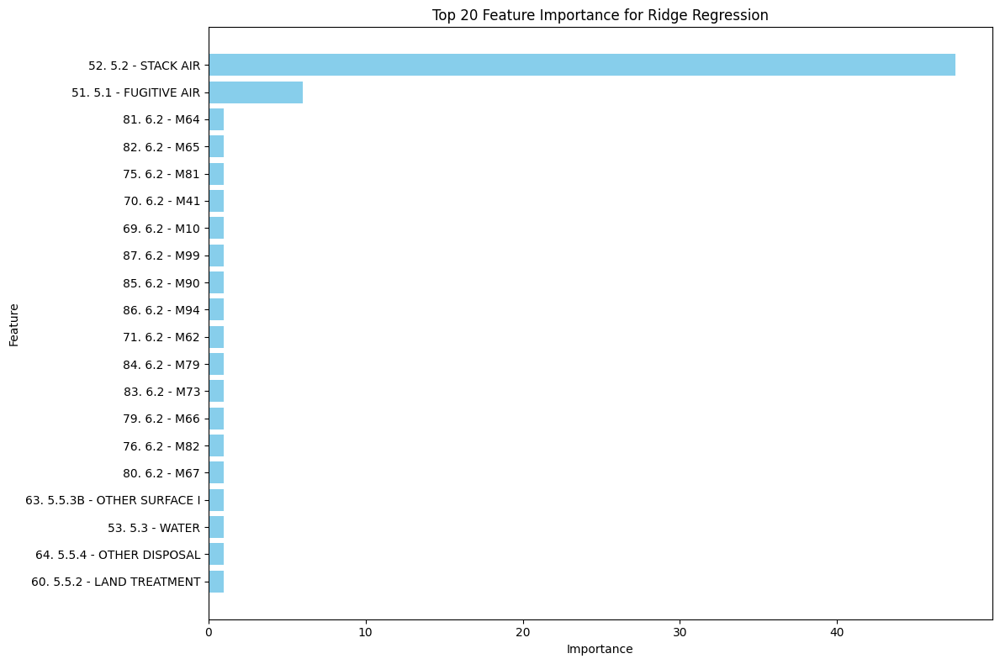

In [ ]:
ridge_regression = Ridge(random_state=42)
float_columns = X_train1.select_dtypes(include=['float']).columns

scaler = RobustScaler()
X_train_scaled = X_train1.copy()
X_test_scaled = X_test1.copy()

X_train_scaled[float_columns] = scaler.fit_transform(X_train1[float_columns])
X_test_scaled[float_columns] = scaler.transform(X_test1[float_columns])

ridge_regression.fit(X_train_scaled, y_train1)

feature_importance = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Importance': ridge_regression.coef_
}).sort_values(by='Importance', ascending=False)

print("Feature Importance Table:")
display(feature_importance)

# Visualisasi hanya 20 fitur teratas
top_features = feature_importance.head(20)

plt.figure(figsize=(12, 8))
plt.barh(top_features['Feature'], top_features['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 20 Feature Importance for Ridge Regression')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

### Summary

Feature Selection Summary
(Diurutkan berdasarkan Feature Importance)

| **Feature**                           | **Feature Importance** | **Mutual Information** | **Select K Best** |
|---------------------------------------|-------------------------|-------------------------|--------------------|
| 52. 5.2 - STACK AIR                  | 47.50694               | 1.061441               | ✅                 |
| 51. 5.1 - FUGITIVE AIR               | 5.99993                | 0.607386               | ✅                 |
| 81. 6.2 - M64                        | 0.9999996              | 0.299965               | ✅                 |
| 82. 6.2 - M65                        | 0.9999996              | 0.012555               | ✅                 |
| 75. 6.2 - M81                        | 0.9999996              | 0.000000               |                    |
| 70. 6.2 - M41                        | 0.9999996              | 0.051530               | ✅                 |
| 69. 6.2 - M10                        | 0.9999996              | 0.000000               |                    |
| 87. 6.2 - M99                        | 0.9999996              | 0.000000               |                    |
| 85. 6.2 - M90                        | 0.9999996              | 0.027211               | ✅                 |
| 86. 6.2 - M94                        | 0.9999996              | 0.019436               | ✅                 |
| 71. 6.2 - M62                        | 0.9999996              | 0.003231               |                    |
| 84. 6.2 - M79                        | 0.9999996              | 0.008095               | ✅                 |
| 83. 6.2 - M73                        | 0.9999996              | 0.000000               |                    |
| 79. 6.2 - M66                        | 0.9999996              | 0.003721               |                    |
| 76. 6.2 - M82                        | 0.9999996              | 0.000000               |                    |
| 80. 6.2 - M67                        | 0.9999913              | 0.000000               |                    |
| 63. 5.5.3B - OTHER SURFACE I         | 0.9999883              | 0.020091               | ✅                 |
| 53. 5.3 - WATER                      | 0.9999883              | 0.086971               | ✅                 |
| 64. 5.5.4 - OTHER DISPOSAL           | 0.9999883              | 0.011823               | ✅                 |
| 60. 5.5.2 - LAND TREATMENT           | 0.9999883              | 0.004341               |                    |
| 56. 5.4.2 - UNDERGROUND C II-V       | 0.9999879              | 0.000000               |                    |
| 62. 5.5.3A - RCRA SURFACE IM         | 0.9999826              | 0.000000               |                    |
| 59. 5.5.1B - OTHER LANDFILLS         | 0.9998708              | 0.042822               | ✅                 |
| 55. 5.4.1 - UNDERGROUND CL I         | 0.9998708              | 0.001567               | ✅                 |
| 58. 5.5.1A - RCRA C LANDFILL         | 0.9998708              | 0.000000               |                    |
| 66. 6.1 - POTW - TRNS RLSE           | 0.6656415              | 0.069738               | ✅                 |
| 68. POTW - TOTAL TRANSFERS           | 0.3343581              | 0.064604               | ✅                 |
| 99. 6.2 - M50                        | 0.04589372             | 0.020538               |                    |
| 101. 6.2 - M61 NON-METAL             | 0.04589372             | 0.002910               |                    |
| 100. 6.2 - M54                       | 0.04589372             | 0.000947               |                    |
| 98. 6.2 - M40 NON-METAL              | 0.04589372             | 0.004191               |                    |
| 103. 6.2 - M95                       | 0.04589372             | 0.000000               |                    |
| 102. 6.2 - M69                       | 0.04589372             | 0.000000               |                    |
| 110. 8.1B - ON-SITE OTHER            | 0.002641037            | 2.720850               | ✅                 |
| 106. 6.2 - TOTAL TRANSFER            | 0.002096665            | 0.419066               | ✅                 |
| 109. 8.1A - ON-SITE CONTAINED        | 0.0001291638           | 0.065819               | ✅                 |
| 49. FORM TYPE                        | 0.0001027602           | 0.188309               | ✅                 |
| 50. UNIT OF MEASURE                  | 0.00007214689          | 0.009840               |                    |
| 94. OFF-SITE RECYCLED TOTAL          | 0.00006850555          | 0.027360               | ✅                 |
| 21. FEDERAL FACILITY                 | 0.00005301320          | 0.006633               |                    |
| Distance_From_Center                 | 0.00004650918          | 0.197837               | ✅                 |
| 43. CLASSIFICATION                   | 0.00004079883          | 0.131130               | ✅                 |
| 47. PBT                              | 0.00003130911          | 0.118428               | ✅                 |
| 121. PROD_RATIO_OR_ ACTIVITY         | 0.00003099915          | 0.000000               |                    |
| 119. PRODUCTION WSTE (8.1-8.7)       | 0.00003070330          | 0.762994               | ✅                 |
| 46. CARCINOGEN                       | 0.00002387738          | 0.027480               | ✅                 |
| 45. METAL CATEGORY                   | 0.00002296009          | 0.061497               | ✅                 |
| 44. METAL                            | 0.00002154222          | 0.025450               | ✅                 |
| 8. ST                                | 0.000003437642         | 0.027071               | ✅                 |
| 7. COUNTY                            | 0.0000004719631        | 0.099398               | ✅                 |
| 2. TRIFD                             | 0.0000001611369        | 0.221262               | ✅                 |
| 111. 8.1C - OFF-SITE CONTAIN         | 0.0000008037670        | 0.386763               | ✅                 |
| 118. 8.7 - TREATMENT OFF SITE        | 0.00000001476595       | 0.051782               | ✅                 |
| 122. 8.9 - PRODUCTION RATIO          | 0.00000002514092       | 0.213078               | ✅                 |
| 112. 8.1D - OFF-SITE OTHER R         | 0.000000001169063      | 0.503158               | ✅                 |
| 14. HORIZONTAL DATUM                 | 0.00000000000000       | 0.002129               |                    |
| 116. 8.5 - RECYCLING OFF SIT         | -1.464552e-10          | 0.031305               |                    |
| 117. 8.6 - TREATMENT ON SITE         | -1.113864e-09          | 0.047550               | ✅                 |
| 115. 8.4 - RECYCLING ON SITE         | -1.155117e-09          | 0.002704               |                    |
| 113. 8.2 - ENERGY RECOVER ON         | -1.191175e-09          | 0.010437               |                    |
| Treatment_Efficiency                 | -8.837973e-09          | 0.098723               | ✅                 |
| 39. TRI CHEMICAL/COMPOUND ID         | -2.793710e-08          | 0.259379               | ✅                 |
| 6. CITY                              | -7.846291e-08          | 0.178712               | ✅                 |
| ... (lanjutkan hingga semua fitur) |


In [ ]:
# Hapus Beberapa Variabel
df_model = df_final.copy()

variables_to_drop = [
    "14. HORIZONTAL DATUM",
    "39. TRI CHEMICAL/COMPOUND ID",
    "6. CITY",
    "96. 6.2 - M92",
    "95. 6.2 - M56",
    "9. ZIP",
    "30. PRIMARY NAICS",
    "37. CHEMICAL",
    "90. 6.2 - M24",
    "89. 6.2 - M20",
    "93. 6.2 - M93",
    "91. 6.2 - M26",
    "92. 6.2 - M28",
    "38. ELEMENTAL METAL INCLUDED",
    "42. CLEAN AIR ACT CHEMICAL"
]

df_model.drop(columns=variables_to_drop, inplace=True)
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9943 entries, 1 to 77955
Data columns (total 72 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   2. TRIFD                        9943 non-null   int64  
 1   7. COUNTY                       9943 non-null   int64  
 2   8. ST                           9943 non-null   int64  
 3   12. LATITUDE                    9943 non-null   float64
 4   13. LONGITUDE                   9943 non-null   float64
 5   21. FEDERAL FACILITY            9943 non-null   int64  
 6   23. INDUSTRY SECTOR             9943 non-null   int64  
 7   43. CLASSIFICATION              9943 non-null   int64  
 8   44. METAL                       9943 non-null   int64  
 9   45. METAL CATEGORY              9943 non-null   int64  
 10  46. CARCINOGEN                  9943 non-null   int64  
 11  47. PBT                         9943 non-null   int64  
 12  48. PFAS                        9943 n

## Model Selection using Cross Validaton (KFold)

Data untuk Model Selection: df_model

Agar dapat melihat konsistensi dari performa model, akan digunakan KFold Validation

In [ ]:
# Membuat daftar nama kolom feature kecuali '107. TOTAL RELEASES'
features = [col for col in df_model.columns if col != '107. TOTAL RELEASES']

X1 = df_model[features]
y1 = df_model['107. TOTAL RELEASES']

X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2, random_state=42)

models = {
    'Ridge Regression': Ridge(random_state=42),
    'LinearRegression': LinearRegression(),
    'Lasso': Lasso(random_state=42),
    'ElasticNet': ElasticNet(alpha=1.0, l1_ratio=0.5, random_state=42)
}

In [ ]:
def evaluate_model_with_kfold_cv_float_scaling(model, X, y, kf):
    mse_scores = []
    r2_scores = []
    mae_scores = []
    mape_scores = []

    float_columns = X.select_dtypes(include=['float']).columns
    int_columns = X.select_dtypes(include=['int']).columns

    for train_index, val_index in kf.split(X):
        # Split data train dan validation
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        # Scaling hanya pada kolom float
        scaler = RobustScaler()
        X_train_scaled = X_train.copy()
        X_val_scaled = X_val.copy()

        X_train_scaled[float_columns] = scaler.fit_transform(X_train[float_columns])
        X_val_scaled[float_columns] = scaler.transform(X_val[float_columns])

        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_val_scaled)

        mse_scores.append(mean_squared_error(y_val, y_pred))
        r2_scores.append(r2_score(y_val, y_pred))
        mae_scores.append(mean_absolute_error(y_val, y_pred))
        mape_scores.append(mean_absolute_percentage_error(y_val, y_pred))

    metrics = {
        'MSE': np.mean(mse_scores),
        'MSE_std': np.std(mse_scores),
        'RMSE': np.sqrt(np.mean(mse_scores)),
        'RMSE_std': np.std(np.sqrt(np.array(mse_scores))),
        'MAE': np.mean(mae_scores),
        'MAE_std': np.std(mae_scores),
        'MAPE': np.mean(mape_scores),
        'MAPE_std': np.std(mape_scores),
        'R^2': np.mean(r2_scores),
        'R^2_std': np.std(r2_scores)
    }

    return metrics

kf = KFold(n_splits=10, shuffle=True, random_state=42)

results_kfold = {}
for model_name, model in models.items():
    results_kfold[model_name] = evaluate_model_with_kfold_cv_float_scaling(model, X_train1, y_train1, kf)

df_results_kfold = pd.DataFrame(results_kfold).T

print("Model Evaluation Results (with KFold Cross-Validation and Float Scaling):")
display(df_results_kfold)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=9.79861e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.81455e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.72503e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.52557e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarnin

Model Evaluation Results (with KFold Cross-Validation and Float Scaling):


,MSE,MSE_std,RMSE,RMSE_std,MAE,MAE_std,MAPE,MAPE_std,R^2,R^2_std
Ridge Regression,3025.699304,8958.376424,55.006357,51.257992,0.735157,1.898918,8.621096e+10,4.355550e+10,1.000000,9.585253e-07
LinearRegression,2983.870470,8951.611329,54.624816,51.820993,0.612733,1.837933,5.331431e+09,3.407804e+08,1.000000,9.570260e-07
Lasso,67763.056413,198078.910664,260.313381,235.957681,8.145157,10.529416,6.421832e+15,4.300754e+15,0.999992,2.108485e-05
ElasticNet,69686.274246,206975.919676,263.981579,245.165926,5.088067,10.584096,7.451824e+14,2.641659e+14,0.999992,2.205541e-05


Alasan Memilih Ridge Regression

---
Berdasarkan hasil evaluasi model dengan KFold Cross-Validation, Ridge Regression dipilih sebagai model terbaik untuk beberapa alasan utama berikut:

1. **Kinerja Metrik yang Sangat Stabil**
- **Mean Squared Error (MSE):** 3025.70 dengan standar deviasi (MSE_std) yang relatif kecil, yaitu 8958.38, menunjukkan stabilitas prediksi dibandingkan model lain.
- **Root Mean Squared Error (RMSE):** 55.01 dengan RMSE_std sebesar 51.26, memberikan hasil yang konsisten dalam performa prediksi.
- **Mean Absolute Error (MAE):** 0.735, yang merupakan nilai MAE terendah kedua setelah Linear Regression, tetapi dengan keunggulan stabilitas lebih tinggi.

2. **Nilai Koefisien Determinasi (R²) yang Mendekati 1**
- Ridge Regression memiliki **R²** yang sangat tinggi (1.000000), dengan standar deviasi yang sangat kecil (9.59e-07). Hal ini menunjukkan bahwa model dapat menjelaskan hampir seluruh variasi dalam data secara konsisten.

3. **Keunggulan Dibandingkan Linear Regression**
- Meskipun Linear Regression memiliki MSE sedikit lebih rendah (2983.87 vs. 3025.70), Ridge Regression memberikan stabilitas yang lebih baik dalam metrik lainnya, seperti RMSE dan MAE, terutama pada nilai deviasi standar (MSE_std dan RMSE_std).
- Ridge Regression juga lebih tahan terhadap multicollinearity dibandingkan Linear Regression, yang menjadikannya lebih andal untuk dataset dengan fitur yang saling berkorelasi.

4. **Kinerja Lebih Baik dari Lasso dan ElasticNet**
- **Lasso** dan **ElasticNet** memiliki nilai MSE, RMSE, dan MAE yang jauh lebih tinggi, menunjukkan performa prediksi yang kurang baik.
- Deviasi standar dari kedua model ini juga jauh lebih besar, yang menandakan ketidakstabilan dalam hasil prediksi.

5. **Regularisasi yang Optimal**
- Ridge Regression menggunakan regularisasi L2, yang memberikan keseimbangan antara bias dan varians, sehingga menghasilkan model yang lebih stabil tanpa mengorbankan performa.

---
 Ringkasan
Ridge Regression dipilih karena:
- Performanya sangat stabil dengan metrik yang sangat baik.
- Lebih tahan terhadap multicollinearity dibanding Linear Regression.
- Kinerja jauh lebih baik dibanding Lasso dan ElasticNet dalam hal akurasi dan stabilitas.

Dengan mempertimbangkan faktor-faktor ini, Ridge Regression menjadi pilihan terbaik untuk prediksi dalam dataset ini.


## Tuning Selected Model

### Kombinasi Pemilihan Solver dan Alpha

In [ ]:
# Function to evaluate Ridge Regression with cross-validation (updated with RMSE and float column scaling)
def evaluate_ridge_cv_with_rmse(X, y, alpha, solver, kf):
    mse_scores = []
    rmse_scores = []
    mae_scores = []
    mape_scores = []
    r2_scores = []

    X = pd.DataFrame(X)
    y = pd.Series(y)

    for train_index, val_index in kf.split(X):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        float_columns = X_train.select_dtypes(include=['float']).columns

        scaler = RobustScaler()
        X_train_scaled = X_train.copy()
        X_val_scaled = X_val.copy()

        X_train_scaled[float_columns] = scaler.fit_transform(X_train[float_columns])
        X_val_scaled[float_columns] = scaler.transform(X_val[float_columns])

        # Train and evaluate Ridge model
        model = Ridge(alpha=alpha, solver=solver)
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_val_scaled)

        mse_scores.append(mean_squared_error(y_val, y_pred))
        rmse_scores.append(np.sqrt(mean_squared_error(y_val, y_pred)))
        mae_scores.append(mean_absolute_error(y_val, y_pred))
        mape_scores.append(mean_absolute_percentage_error(y_val, y_pred))
        r2_scores.append(r2_score(y_val, y_pred))

    return {
        'MSE': np.mean(mse_scores),
        'RMSE': np.mean(rmse_scores),
        'MAE': np.mean(mae_scores),
        'MAPE': np.mean(mape_scores),
        'R^2': np.mean(r2_scores)
    }

# Define parameters for the evaluation
alphas = [0.01, 0.1, 1.0, 10.0, 100.0]
solvers = ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']  # Ridge solvers
kf = KFold(n_splits=10, shuffle=True, random_state=42)  # K-Fold Cross Validation

results = []

for alpha in alphas:
    for solver in solvers:
        metrics = evaluate_ridge_cv_with_rmse(X_train1, y_train1, alpha, solver, kf)
        results.append({
            'Solver': solver,
            'Alpha': alpha,
            **metrics
        })

df_results = pd.DataFrame(results)
print("Ridge Regression Cross-Validation Results:")
df_results

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=4.40018e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.40007e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.64976e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=4.40018e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarnin

Ridge Regression Cross-Validation Results:


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


,Solver,Alpha,MSE,RMSE,MAE,MAPE,R^2
0,auto,0.01,2.999687e+03,18.726306,0.664412,1.399599e+10,1.000000
1,svd,0.01,2.999687e+03,18.723584,0.664310,7.192405e+09,1.000000
2,cholesky,0.01,2.999687e+03,18.726306,0.664412,1.399599e+10,1.000000
3,lsqr,0.01,2.884056e+08,15573.547035,3666.830194,2.252182e+18,0.946324
4,sparse_cg,0.01,1.305203e+08,5650.843846,1879.866000,1.973900e+18,0.975994
5,sag,0.01,7.950174e+09,56249.150151,8084.315781,4.121760e+18,0.769020
6,saga,0.01,1.487122e+10,72991.593603,9944.079162,5.056738e+18,0.685431
7,auto,0.10,3.008062e+03,19.452119,0.692677,2.660039e+10,1.000000
8,svd,0.10,3.008062e+03,19.449837,0.692594,1.761399e+10,1.000000
9,cholesky,0.10,3.008062e+03,19.452119,0.692677,2.660039e+10,1.000000


### Grafik MAE dan RMSE

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.36081e-21): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.8009e-21): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.74072e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=2.20177e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning

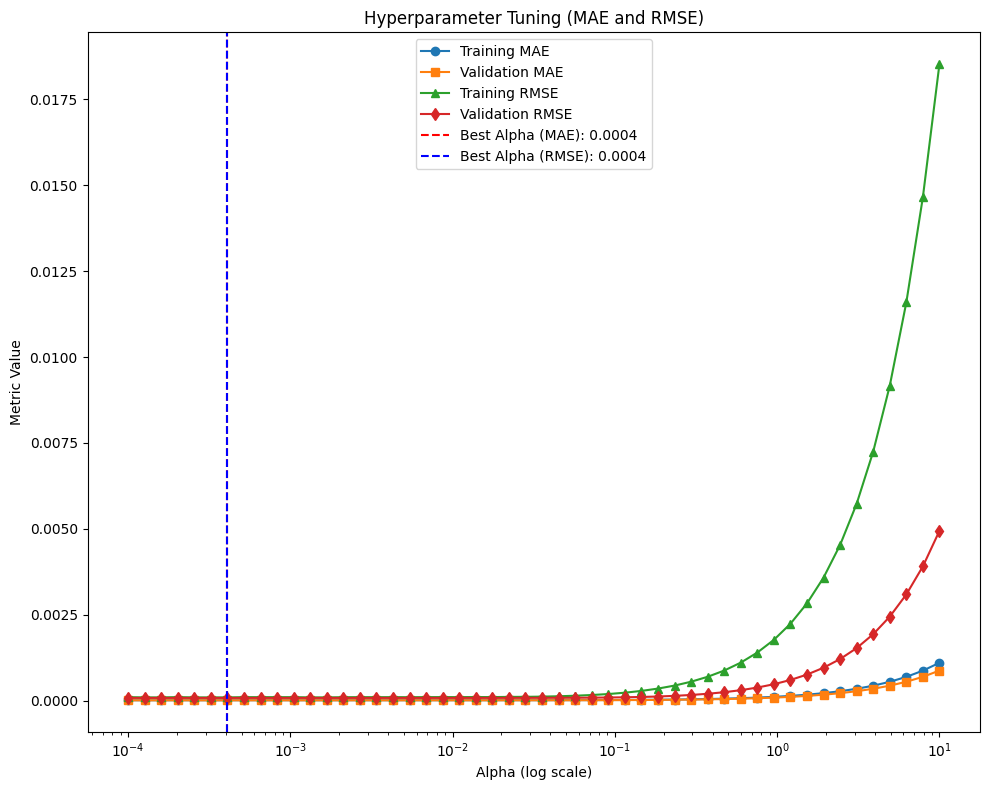

In [ ]:
float_columns = X_train1.select_dtypes(include=['float']).columns

# Scaling only float columns for X_train1 and X_test1
scaler = RobustScaler()
X_train_scaled = X_train1.copy()
X_test_scaled = X_test1.copy()
X_train_scaled[float_columns] = scaler.fit_transform(X_train1[float_columns])
X_test_scaled[float_columns] = scaler.transform(X_test1[float_columns])

# List of hyperparameter values for alpha
alphas = np.logspace(-4, 1, 50)  # From 0.0001 to 10

train_mae, val_mae = [], []
train_rmse, val_rmse = [], []

for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train_scaled, y_train1)
    y_train_pred = ridge.predict(X_train_scaled)
    y_val_pred = ridge.predict(X_test_scaled)
    train_mae.append(mean_absolute_error(y_train1, y_train_pred))
    val_mae.append(mean_absolute_error(y_test1, y_val_pred))
    train_rmse.append(np.sqrt(mean_squared_error(y_train1, y_train_pred)))
    val_rmse.append(np.sqrt(mean_squared_error(y_test1, y_val_pred)))

plt.figure(figsize=(10, 8))

# MAE Plot
plt.plot(alphas, train_mae, label='Training MAE', marker='o')
plt.plot(alphas, val_mae, label='Validation MAE', marker='s')

# RMSE Plot
plt.plot(alphas, train_rmse, label='Training RMSE', marker='^')
plt.plot(alphas, val_rmse, label='Validation RMSE', marker='d')

# Highlight the best alpha for MAE and RMSE
best_alpha_mae = alphas[np.argmin(val_mae)]
best_alpha_rmse = alphas[np.argmin(val_rmse)]
plt.axvline(best_alpha_mae, color='red', linestyle='--', label=f'Best Alpha (MAE): {best_alpha_mae:.4f}')
plt.axvline(best_alpha_rmse, color='blue', linestyle='--', label=f'Best Alpha (RMSE): {best_alpha_rmse:.4f}')

plt.xscale('log')
plt.xlabel('Alpha (log scale)')
plt.ylabel('Metric Value')
plt.title('Hyperparameter Tuning (MAE and RMSE)')
plt.legend()
plt.tight_layout()
plt.show()

### GridSearchCV

Dipilih berdasarkan metrik MAE dan RMSE

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.36095e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


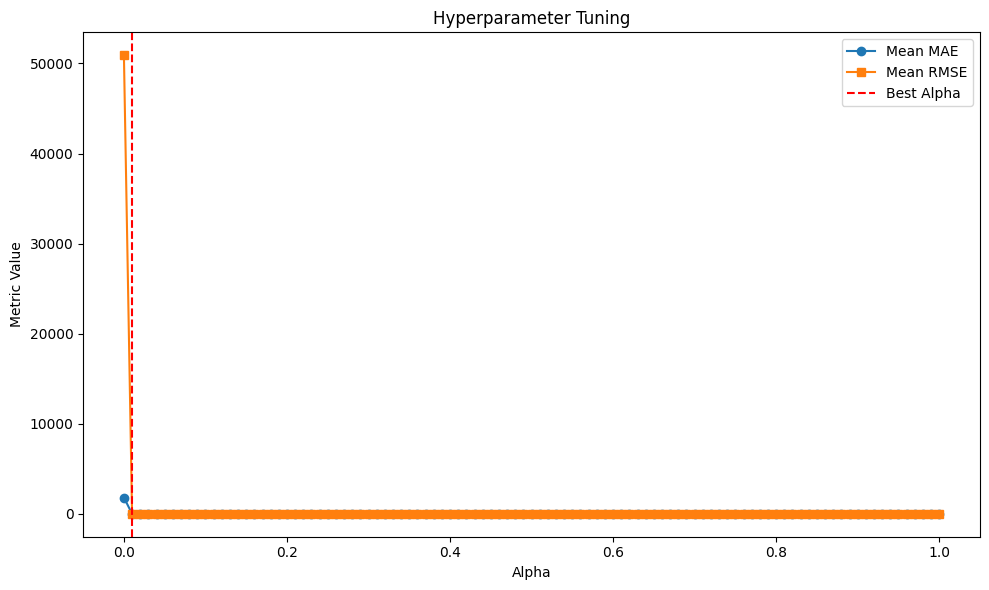

Best Hyperparameters: {'ridge__alpha': 0.01}
Best MAE: 0.664
Best RMSE: 18.728


In [ ]:
np.random.seed(42)
random.seed(42)

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

scoring = {
    'MAE': make_scorer(mean_absolute_error, greater_is_better=False),
    'RMSE': make_scorer(rmse, greater_is_better=False)
}

param_grid = {'ridge__alpha': np.arange(0, 1.01, 0.01)}

model = Pipeline([
    ('scaler', RobustScaler()),  # Scaling only float columns
    ('ridge', Ridge())
])

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=42)

# Perform GridSearchCV
search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, refit='RMSE', cv=cv, n_jobs=-1)
search.fit(X_train1, y_train1)

mean_mae = -search.cv_results_['mean_test_MAE']
mean_rmse = -search.cv_results_['mean_test_RMSE']

plt.figure(figsize=(10, 6))
plt.plot(param_grid['ridge__alpha'], mean_mae, label='Mean MAE', marker='o')
plt.plot(param_grid['ridge__alpha'], mean_rmse, label='Mean RMSE', marker='s')
plt.axvline(search.best_params_['ridge__alpha'], color='red', linestyle='--', label='Best Alpha')
plt.xlabel('Alpha')
plt.ylabel('Metric Value')
plt.title('Hyperparameter Tuning')
plt.legend()
plt.tight_layout()
plt.show()

print("Best Hyperparameters:", search.best_params_)
print("Best MAE: %.3f" % -search.cv_results_['mean_test_MAE'][search.best_index_])
print("Best RMSE: %.3f" % -search.best_score_)

### RidgeCV

Dipilih berdasarkan metrik MAE dan RMSE

In [ ]:
np.random.seed(42)
random.seed(42)

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Define hyperparameter range and evaluation method
alphas = np.arange(0, 1.01, 0.01)
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=42)

pipeline_mae = Pipeline([
    ('scaler', RobustScaler()),
    ('ridge', RidgeCV(alphas=alphas, scoring=make_scorer(mean_absolute_error, greater_is_better=False), cv=cv))
])

pipeline_rmse = Pipeline([
    ('scaler', RobustScaler()),
    ('ridge', RidgeCV(alphas=alphas, scoring=make_scorer(rmse, greater_is_better=False), cv=cv))
])

# Fit RidgeCV for MAE
pipeline_mae.fit(X_train1, y_train1)

# Fit RidgeCV for RMSE
pipeline_rmse.fit(X_train1, y_train1)

# Extract best alpha values
ridge_mae = pipeline_mae.named_steps['ridge']
ridge_rmse = pipeline_rmse.named_steps['ridge']

print("Best alpha (MAE):", ridge_mae.alpha_)
print("Best alpha (RMSE):", ridge_rmse.alpha_)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.25819e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.16516e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=4.22623e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=5.5251e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-package

Best alpha (MAE): 0.01
Best alpha (RMSE): 0.01


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=4.06424e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.29902e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.17397e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.57992e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarnin

Best alpha (MAE): 0.01

Best alpha (RMSE): 0.01

### Kesimpulan Pemilihan Solver dan Alpha

---
**1. Solver: auto**

Solver **auto** dipilih karena hasil cross-validation menunjukkan bahwa solver ini memberikan performa yang optimal dan konsisten, dengan nilai **MSE**, **RMSE**, **MAE**, dan **MAPE** yang sama atau hampir identik dengan solver lain seperti **svd**, **cholesky**, dan **lsqr**. Solver **auto** memiliki keunggulan dalam fleksibilitasnya untuk secara otomatis memilih algoritma terbaik berdasarkan sifat data, menjadikannya andal dan efisien tanpa perlu intervensi manual. Ini mempermudah implementasi model terutama dalam skenario dengan berbagai macam dataset.

---

**2. Alpha: 0.01**

- Berdasarkan hasil dari **GridSearchCV**, **RidgeCV**, dan evaluasi manual (grafik MAE dan RMSE), alpha terbaik adalah **0.01**.
- **GridSearchCV** dan **RidgeCV** menunjukkan bahwa alpha ini menghasilkan nilai **MAE** dan **RMSE** yang optimal.
- Ketika alpha = 0, Ridge Regression menjadi identik dengan Linear Regression, karena tidak ada regularisasi yang diterapkan. Oleh karena itu, nilai alpha = 0.01 dipilih untuk tetap memanfaatkan manfaat regularisasi Ridge Regression, seperti mengurangi overfitting dan meningkatkan stabilitas model.

---

### Alasan Memilih Kombinasi auto dan 0.01
Solver **auto** dan alpha **0.01** memberikan kombinasi yang unggul dengan hasil performa yang konsisten, memanfaatkan regularisasi Ridge Regression, serta fleksibilitas solver dalam berbagai kondisi dataset.


## Best Model: Ridge Regression with Tuning Parameter (solver: auto, alpha= 0.01)

##### Fitting

Model Tersimpan: model

In [ ]:
# Function to evaluate the best model and save the trained Ridge model
def evaluate_and_save_best_model_ridge(alpha, X_train, X_test, y_train, y_test):
    float_columns = X_train.select_dtypes(include=['float']).columns

    # Apply scaling only to float columns
    scaler = RobustScaler()
    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()
    X_train_scaled[float_columns] = scaler.fit_transform(X_train[float_columns])
    X_test_scaled[float_columns] = scaler.transform(X_test[float_columns])

    model = Ridge(alpha=alpha)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return {
        'metrics': {'MSE': mse, 'RMSE': rmse, 'MAE': mae, 'MAPE': mape, 'R^2': r2},
        'model': model
    }

# Hyperparameter tuning results
best_alpha = 0.01

results = evaluate_and_save_best_model_ridge(best_alpha, X_train1, X_test1, y_train1, y_test1)
metrics = results['metrics']
model = results['model']


df_results = pd.DataFrame([metrics], index=['Ridge Regression'])
print("Model Evaluation Results (Best Model Ridge Regression):")
display(df_results)

Model Evaluation Results (Best Model Ridge Regression):


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.36092e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


,MSE,RMSE,MAE,MAPE,R^2
Ridge Regression,6.638939e-09,0.000081,0.000012,5.417994e+09,1.0


##### Cross Validation (KFold)

In [ ]:
def evaluate_model_with_kfold_cv(alpha, X, y, kf):
    mse_scores = []
    r2_scores = []
    mae_scores = []
    mape_scores = []

    X = pd.DataFrame(X)
    y = pd.Series(y)

    for train_index, val_index in kf.split(X):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]


        float_columns = X_train.select_dtypes(include=['float']).columns

        # Apply scaling only to float columns
        scaler = RobustScaler()
        X_train_scaled = X_train.copy()
        X_val_scaled = X_val.copy()
        X_train_scaled[float_columns] = scaler.fit_transform(X_train[float_columns])
        X_val_scaled[float_columns] = scaler.transform(X_val[float_columns])

        # Ridge regression model
        model = Ridge(alpha=alpha)
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_val_scaled)

        mse_scores.append(mean_squared_error(y_val, y_pred))
        r2_scores.append(r2_score(y_val, y_pred))
        mae_scores.append(mean_absolute_error(y_val, y_pred))
        mape_scores.append(mean_absolute_percentage_error(y_val, y_pred))

    metrics = {
        'MSE': np.mean(mse_scores),
        'MSE_std': np.std(mse_scores),
        'RMSE': np.sqrt(np.mean(mse_scores)),
        'RMSE_std': np.std(np.sqrt(np.array(mse_scores))),
        'MAE': np.mean(mae_scores),
        'MAE_std': np.std(mae_scores),
        'MAPE': np.mean(mape_scores),
        'MAPE_std': np.std(mape_scores),
        'R^2': np.mean(r2_scores),
        'R^2_std': np.std(r2_scores)
    }

    return metrics

# KFold cross-validation setup
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Best alpha from hyperparameter tuning
best_alpha = 0.01

results_kfold = evaluate_model_with_kfold_cv(best_alpha, X_train1.values, y_train1.values, kf)

df_results_kfold = pd.DataFrame([results_kfold], index=['Ridge Regression'])
print("Model Evaluation Results (with KFold Cross-Validation):")
display(df_results_kfold)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.44253e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=8.3353e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.64979e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Evaluation Results (with KFold Cross-Validation):


,MSE,MSE_std,RMSE,RMSE_std,MAE,MAE_std,MAPE,MAPE_std,R^2,R^2_std
Ridge Regression,2999.687473,8946.457714,54.769403,51.468562,0.664412,1.826211,1.399923e+10,1.817810e+10,1.0,9.565859e-07


#### Hasil Hyperparam Lebih Baik

In [ ]:
# Evaluate Ridge Regression before tuning
def evaluate_ridge_before_tuning(X_train, X_test, y_train, y_test):
    float_columns = X_train.select_dtypes(include=['float']).columns
    scaler = RobustScaler()
    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()
    X_train_scaled[float_columns] = scaler.fit_transform(X_train[float_columns])
    X_test_scaled[float_columns] = scaler.transform(X_test[float_columns])

    # Ridge Regression with default alpha (1.0)
    model = Ridge(alpha=1.0)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return {'MSE': mse, 'RMSE': rmse, 'MAE': mae, 'R^2': r2}

results_before = evaluate_ridge_before_tuning(X_train1, X_test1, y_train1, y_test1)

df_results_before = pd.DataFrame([results_before], index=['Ridge Regression'])

# Cross-validation
def evaluate_ridge_cv_before_tuning(X, y, kf):
    mse_scores = []
    r2_scores = []
    mae_scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        float_columns = X_train.select_dtypes(include=['float']).columns
        scaler = RobustScaler()
        X_train_scaled = X_train.copy()
        X_val_scaled = X_val.copy()
        X_train_scaled[float_columns] = scaler.fit_transform(X_train[float_columns])
        X_val_scaled[float_columns] = scaler.transform(X_val[float_columns])

        model = Ridge(alpha=1.0)
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_val_scaled)

        mse_scores.append(mean_squared_error(y_val, y_pred))
        r2_scores.append(r2_score(y_val, y_pred))
        mae_scores.append(mean_absolute_error(y_val, y_pred))

    metrics = {
        'MSE': np.mean(mse_scores),
        'MSE_std': np.std(mse_scores),
        'RMSE': np.sqrt(np.mean(mse_scores)),
        'RMSE_std': np.std(np.sqrt(np.array(mse_scores))),
        'MAE': np.mean(mae_scores),
        'MAE_std': np.std(mae_scores),
        'R^2': np.mean(r2_scores),
        'R^2_std': np.std(r2_scores)
    }

    return metrics

kf = KFold(n_splits=10, shuffle=True, random_state=42)
results_cv_before = evaluate_ridge_cv_before_tuning(X_train1, y_train1, kf)
df_results_cv_before = pd.DataFrame([results_cv_before], index=['Ridge Regression'])

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.37095e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=9.79861e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.81455e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.72503e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarnin

Testing Before: 4, Testing After: 4
CV Before: 4, CV After: 4


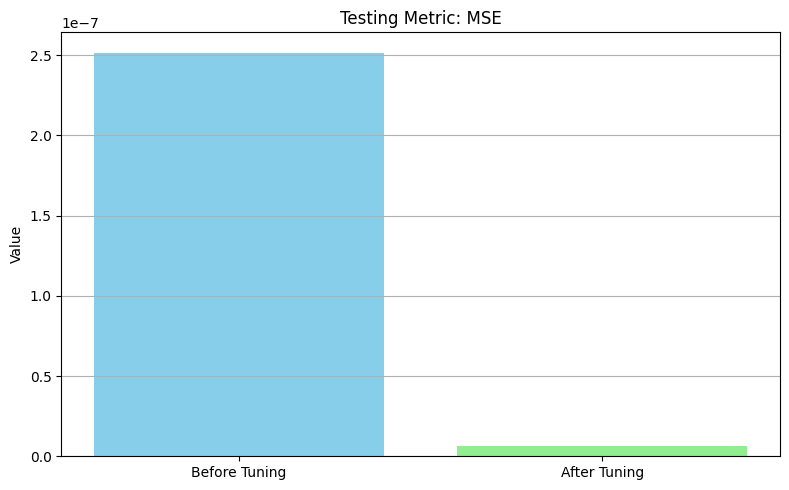

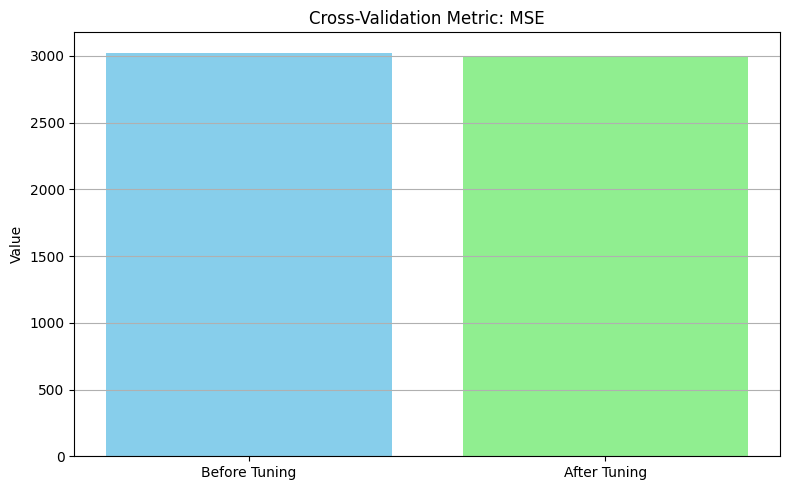

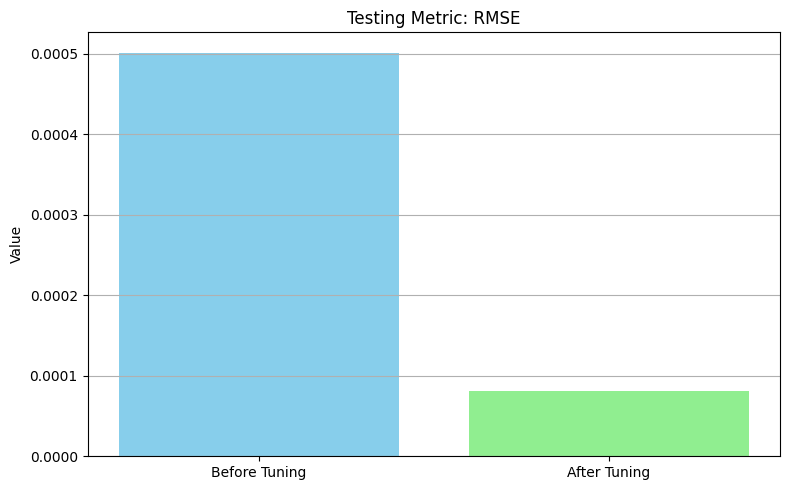

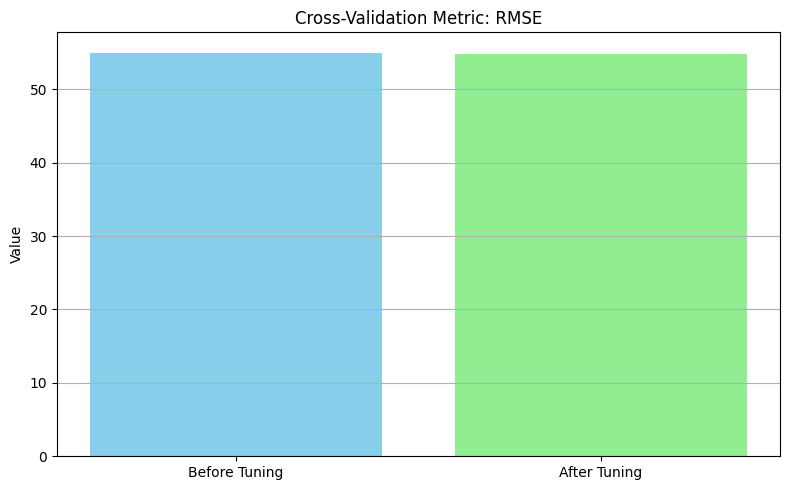

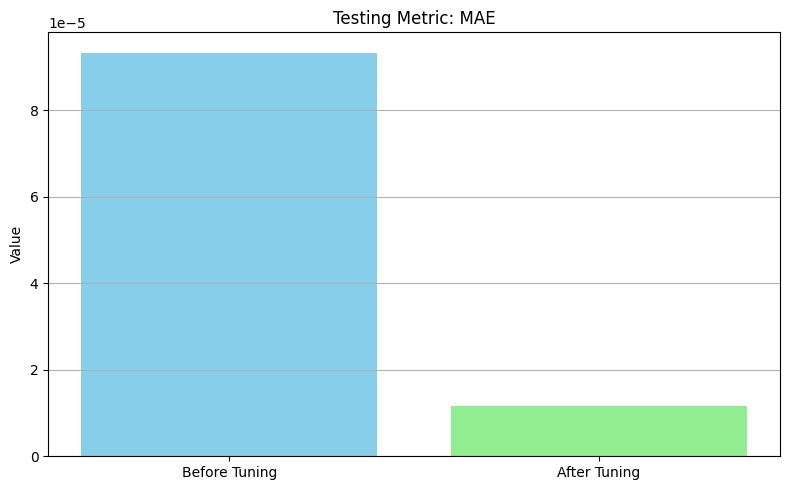

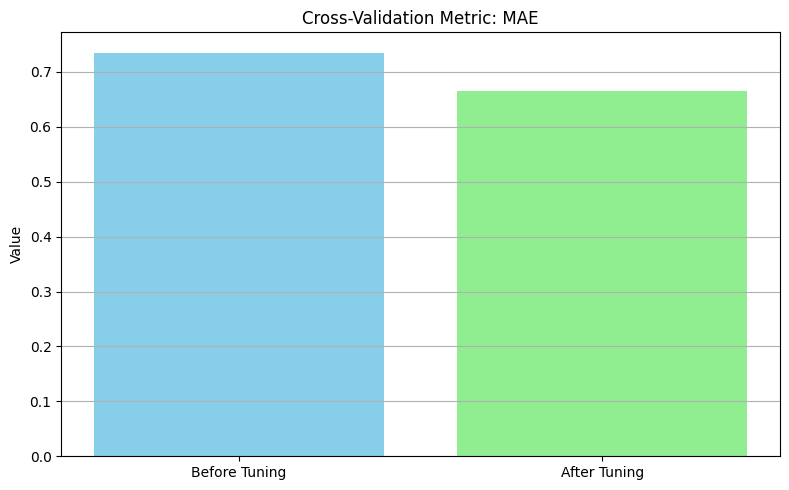

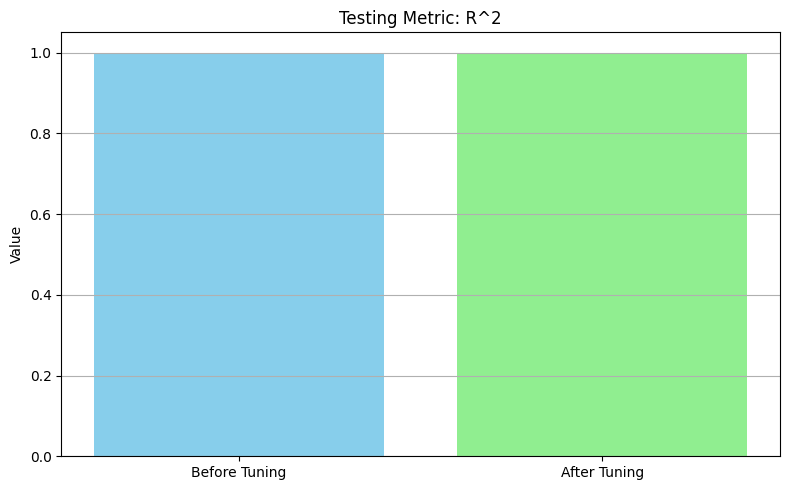

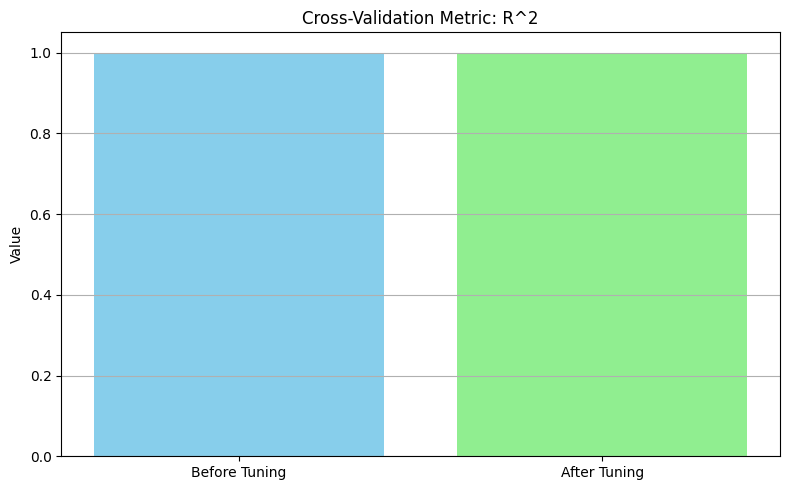

In [ ]:
testing_before = df_results_before.loc['Ridge Regression', metrics].values
testing_after = df_results.loc['Ridge Regression', metrics].values
cv_before = df_results_cv_before.loc['Ridge Regression', metrics].values
cv_after = df_results_kfold.loc['Ridge Regression', metrics].values

print(f"Testing Before: {len(testing_before)}, Testing After: {len(testing_after)}")
print(f"CV Before: {len(cv_before)}, CV After: {len(cv_after)}")

for i, metric in enumerate(metrics):
    # Testing Metrics Before vs After Tuning
    plt.figure(figsize=(8, 5))
    plt.bar(['Before Tuning', 'After Tuning'], [testing_before[i], testing_after[i]], color=['skyblue', 'lightgreen'])
    plt.title(f'Testing Metric: {metric}')
    plt.ylabel('Value')
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

    # Cross-Validation Metrics Before vs After Tuning
    plt.figure(figsize=(8, 5))
    plt.bar(['Before Tuning', 'After Tuning'], [cv_before[i], cv_after[i]], color=['skyblue', 'lightgreen'])
    plt.title(f'Cross-Validation Metric: {metric}')
    plt.ylabel('Value')
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

In [ ]:
# Table Comparison for Testing Metrics
df_comparison_testing = pd.DataFrame({
    'Before Tuning': df_results_before.loc['Ridge Regression', metrics].values,
    'After Tuning': df_results.loc['Ridge Regression', metrics].values
}, index=metrics)

# Table Comparison for Cross-Validation Metrics
df_comparison_cv = pd.DataFrame({
    'Before Tuning': df_results_cv_before.loc['Ridge Regression', metrics].values,
    'After Tuning': df_results_kfold.loc['Ridge Regression', metrics].values
}, index=metrics)

print("Comparison Table for Testing Metrics:")
display(df_comparison_testing)

print("\nComparison Table for Cross-Validation Metrics:")
display(df_comparison_cv)

Comparison Table for Testing Metrics:


,Before Tuning,After Tuning
MSE,2.516371e-07,6.638939e-09
RMSE,5.016345e-04,8.147968e-05
MAE,9.338976e-05,1.162472e-05
R^2,1.000000e+00,1.000000e+00



Comparison Table for Cross-Validation Metrics:


,Before Tuning,After Tuning
MSE,3025.699304,2999.687473
RMSE,55.006357,54.769403
MAE,0.735157,0.664412
R^2,1.000000,1.000000


Perbandingan Kinerja Ridge Regression Sebelum dan Sesudah Hyperparameter Tuning

---
Hasil Evaluasi pada Data Testing
- **MSE**: Menurun dari 2.516371e-07 menjadi 6.638939e-09.
- **RMSE**: Menurun dari 5.016345e-04 menjadi 8.147968e-05.
- **MAE**: Menurun dari 9.338976e-05 menjadi 1.162472e-05.
- **R²**: Tetap optimal di 1.000000.

---
Hasil Evaluasi dengan Cross-Validation
- **MSE**: Menurun dari 3025.699304 menjadi 2999.687473.
- **RMSE**: Menurun dari 55.006357 menjadi 54.769403.
- **MAE**: Menurun dari 0.735157 menjadi 0.664412.
- **R²**: Tetap optimal di 1.000000.

---
Kesimpulan
- **Hyperparameter tuning** meningkatkan akurasi model dengan menurunkan error pada data testing dan cross-validation.
- Model menjadi lebih akurat dan stabil, sehingga lebih andal untuk prediksi data baru.

#### Plot Residual

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.36095e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


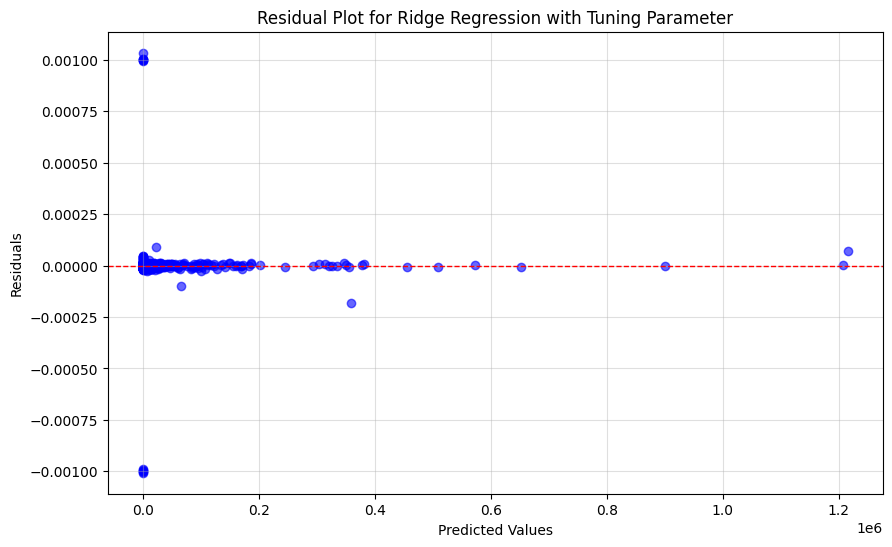

In [ ]:
def plot_residuals(model, X_train, X_test, y_train, y_test, title):
    scaler = RobustScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)

    residuals = y_test - y_pred

    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred, residuals, alpha=0.6, color='blue')
    plt.axhline(y=0, color='red', linestyle='--', linewidth=1)
    plt.title(f'Residual Plot for {title}')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.grid(alpha=0.4)
    plt.show()

plot_residuals(model, X_train1, X_test1, y_train1, y_test1, "Ridge Regression with Tuning Parameter")

Kesimpulan dari Residual Plot

---
Observasi Utama:
1. **Residual Terkonsentrasi di Sekitar Nol**:
   - Sebagian besar residual terkonsentrasi di sekitar garis nol, menunjukkan bahwa model mampu menangkap pola data secara keseluruhan dengan baik. Nilai prediksi secara umum cukup akurat.

2. **Homoskedastisitas**:
   - Residual tersebar merata di sekitar garis nol untuk semua nilai prediksi. Hal ini menunjukkan bahwa asumsi variansi konstan (homoskedastisitas) sebagian besar terpenuhi.

3. **Outlier**:
   - Beberapa residual menyimpang cukup jauh dari nol, yang mungkin menunjukkan adanya outlier dalam dataset. Ini mengindikasikan bahwa model mengalami kesulitan untuk memprediksi Total Releases dengan akurat pada kasus tertentu.

4. **Tidak Ada Pola yang Jelas**:
   - Tidak terdapat pola sistematis dalam distribusi residual (misalnya pola berbentuk corong atau kurva). Hal ini menunjukkan bahwa model tidak mengalami bias signifikan atau masalah non-linearitas yang tidak teratasi.

---
Kesimpulan:
- Model secara umum memiliki performa yang baik, dengan prediksi yang akurat dan bias minimal. Namun, keberadaan outlier dapat menjadi indikasi bahwa model memerlukan perbaikan lebih lanjut, baik dengan menangani data anomali maupun menambahkan fitur baru untuk representasi data yang lebih baik.

## Analisis Model Terbaik

### Feature Importance

Feature Importance for Asia Tenggara:


,Feature,Coefficient
16,52. 5.2 - STACK AIR,4.750749e+01
15,51. 5.1 - FUGITIVE AIR,5.999999e+00
21,59. 5.5.1B - OTHER LANDFILLS,1.000026e+00
18,55. 5.4.1 - UNDERGROUND CL I,1.000026e+00
20,58. 5.5.1A - RCRA C LANDFILL,1.000026e+00
32,75. 6.2 - M81,1.000000e+00
36,81. 6.2 - M64,1.000000e+00
37,82. 6.2 - M65,1.000000e+00
42,87. 6.2 - M99,1.000000e+00
41,86. 6.2 - M94,1.000000e+00


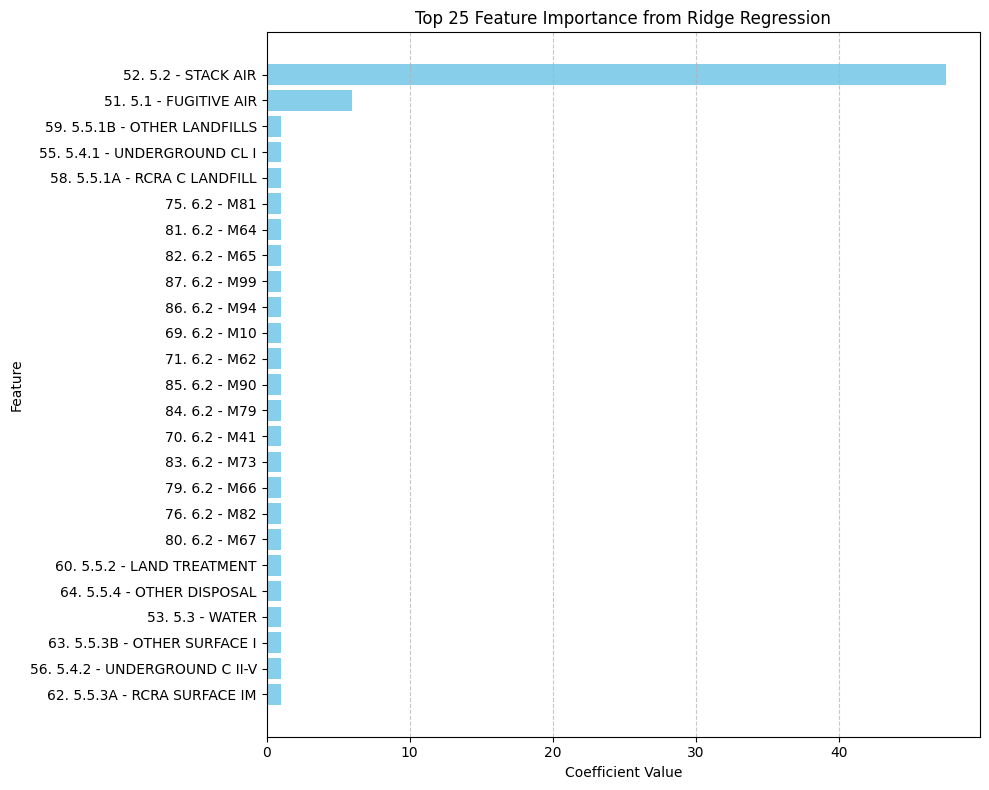

In [ ]:
def extract_feature_importance(model, feature_names):
    coefficients = model.coef_
    feature_importance = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coefficients
    }).sort_values(by='Coefficient', ascending=False)
    return feature_importance

feature_names = X_train1.columns

# Feature importance for the model
feature_importance = extract_feature_importance(model, feature_names)
print("Feature Importance for Asia Tenggara:")
display(feature_importance)

# Plot top 25 features
top_25_features = feature_importance.head(25)
plt.figure(figsize=(10, 8))
plt.barh(top_25_features['Feature'], top_25_features['Coefficient'], color='skyblue')
plt.title('Top 25 Feature Importance from Ridge Regression')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

---
Interpretasi Hasil *Feature Importance* Model Terbaik

1. **Variabel dengan Koefisien Tinggi**
- **52. 5.2 - STACK AIR** (Koefisien: 47.51):
  Variabel ini menunjukkan jumlah total bahan kimia beracun yang dilepaskan melalui emisi udara melalui cerobong atau titik sumber. Koefisien tinggi menandakan bahwa emisi melalui cerobong memiliki kontribusi terbesar dalam prediksi model.
- **51. 5.1 - FUGITIVE AIR** (Koefisien: 6.00):
  Emisi udara tidak terkendali (misalnya, kebocoran dari peralatan) juga berkontribusi signifikan terhadap model, tetapi dampaknya lebih kecil dibandingkan emisi terkontrol.

2. **Pembuangan Limbah**
- **59. 5.5.1B - OTHER LANDFILLS** hingga **55. 5.4.1 - UNDERGROUND CL I** (Koefisien: 1.00):
  Variabel ini mencakup pola pembuangan bahan kimia ke landfill non-RCRA, landfill RCRA, dan sumur injeksi bawah tanah. Semua memiliki kontribusi serupa, menunjukkan pentingnya pola pembuangan ini dalam prediksi total emisi.
- **75. 6.2 - M81** hingga **80. 6.2 - M67** (Koefisien: 1.00):
  Variabel ini mencakup berbagai metode pembuangan limbah di luar lokasi, seperti injeksi bawah tanah dan landfill. Semua metode ini memiliki peran yang seimbang dalam model.

3. **Transfer Limbah**
- **6.1 - POTW - TRNS RLSE** (Koefisien: 0.84):
  Transfer limbah ke *Publicly Owned Treatment Works* (POTW) untuk pelepasan memberikan kontribusi lebih kecil dibandingkan variabel utama.

4. **Variabel dengan Koefisien Negatif**
- **Contoh: 8.6 - TREATMENT ON SITE, RECYCLING EFFICIENCY**:
  Variabel dengan koefisien negatif kecil menunjukkan hubungan terbalik dengan prediksi model. Semakin tinggi aktivitas pengolahan limbah di lokasi atau efisiensi daur ulang, semakin rendah prediksi total pelepasan bahan kimia.

5. **Variabel Demografi dan Geografis**
- **LATITUDE, LONGITUDE**:
  Koefisien yang sangat kecil atau negatif menunjukkan bahwa lokasi geografis tidak memiliki pengaruh signifikan terhadap prediksi model.

---

**Kesimpulan**
- **Dominasi Emisi Udara**: Variabel terkait emisi udara, baik terkendali (*STACK AIR*) maupun tidak terkendali (*FUGITIVE AIR*), memiliki kontribusi terbesar dalam prediksi total pelepasan bahan kimia.
- **Pembuangan Limbah**: Metode pembuangan limbah (di lokasi maupun luar lokasi) memiliki pengaruh penting, tetapi relatif lebih kecil dibandingkan emisi udara.
- **Efisiensi Daur Ulang dan Pengolahan Limbah**: Faktor-faktor ini menunjukkan hubungan terbalik dengan prediksi total pelepasan, meskipun kontribusinya minimal.
- **Fokus Prioritas**: Berdasarkan hasil model, fokus utama dalam pengelolaan limbah harus diarahkan pada pengurangan emisi udara untuk meningkatkan keberlanjutan dan efisiensi lingkungan.


### SHAP

In [ ]:
shap.initjs()

In [ ]:
def scale_float_features(X_train, X_test):
    float_columns = X_train.select_dtypes(include=['float']).columns
    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()

    scaler = RobustScaler()
    X_train_scaled[float_columns] = scaler.fit_transform(X_train[float_columns])
    X_test_scaled[float_columns] = scaler.transform(X_test[float_columns])

    return scaler, X_train_scaled, X_test_scaled


scaler, X_train1_scaled, X_test1_scaled = scale_float_features(X_train1, X_test1)
feature_names = X_train1.columns
explainer = shap.Explainer(model, X_test1_scaled, feature_names=feature_names)
shap_values= explainer(X_test1_scaled)

In [ ]:
shap.plots.force(shap_values[0, ...])

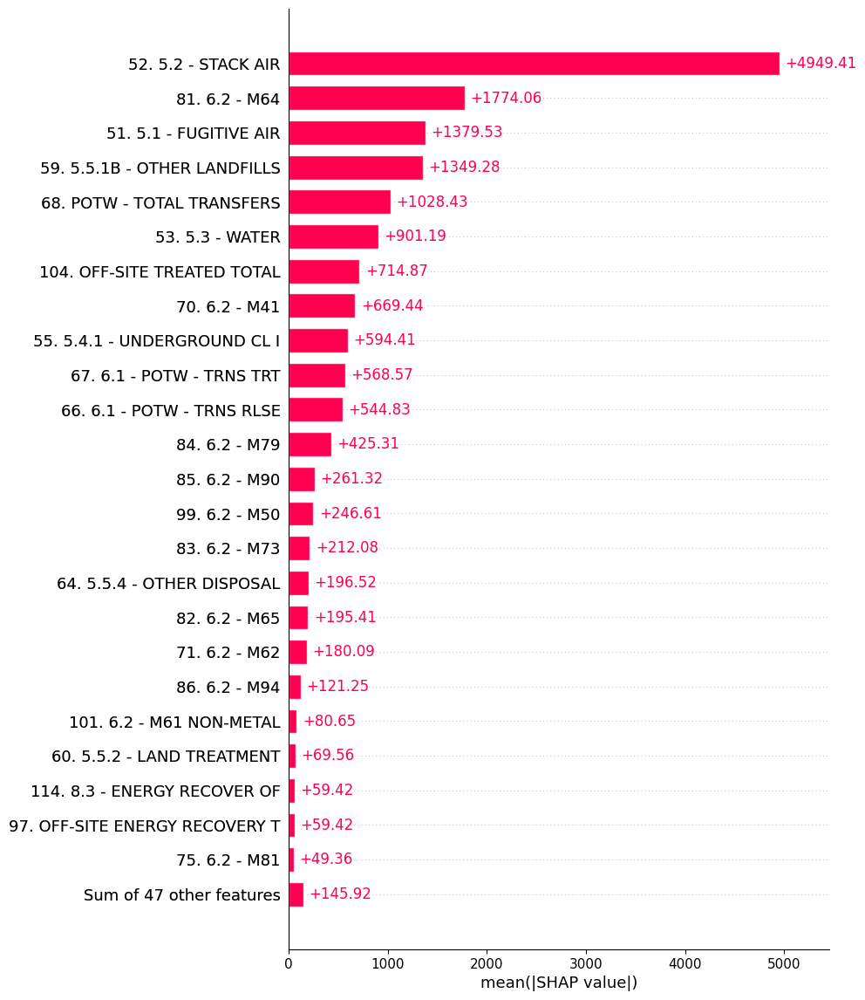

In [ ]:
shap.plots.bar(shap_values, max_display=25)

In [ ]:
shap_importance = pd.DataFrame({
    'Feature': feature_names,
    'Mean SHAP Value': np.abs(shap_values.values).mean(axis=0)
}).sort_values(by='Mean SHAP Value', ascending=False)

print("Mean SHAP Value:")
print(shap_importance)

Mean SHAP Value:
                           Feature  Mean SHAP Value
16             52. 5.2 - STACK AIR     4.949414e+03
36                   81. 6.2 - M64     1.774057e+03
15          51. 5.1 - FUGITIVE AIR     1.379525e+03
21    59. 5.5.1B - OTHER LANDFILLS     1.349280e+03
28      68. POTW - TOTAL TRANSFERS     1.028429e+03
17                 53. 5.3 - WATER     9.011947e+02
51     104. OFF-SITE TREATED TOTAL     7.148691e+02
30                   70. 6.2 - M41     6.694414e+02
18    55. 5.4.1 - UNDERGROUND CL I     5.944147e+02
27       67. 6.1 - POTW - TRNS TRT     5.685694e+02
26      66. 6.1 - POTW - TRNS RLSE     5.448306e+02
39                   84. 6.2 - M79     4.253133e+02
40                   85. 6.2 - M90     2.613188e+02
46                   99. 6.2 - M50     2.466141e+02
38                   83. 6.2 - M73     2.120773e+02
25      64. 5.5.4 - OTHER DISPOSAL     1.965202e+02
37                   82. 6.2 - M65     1.954143e+02
31                   71. 6.2 - M62     1.800933

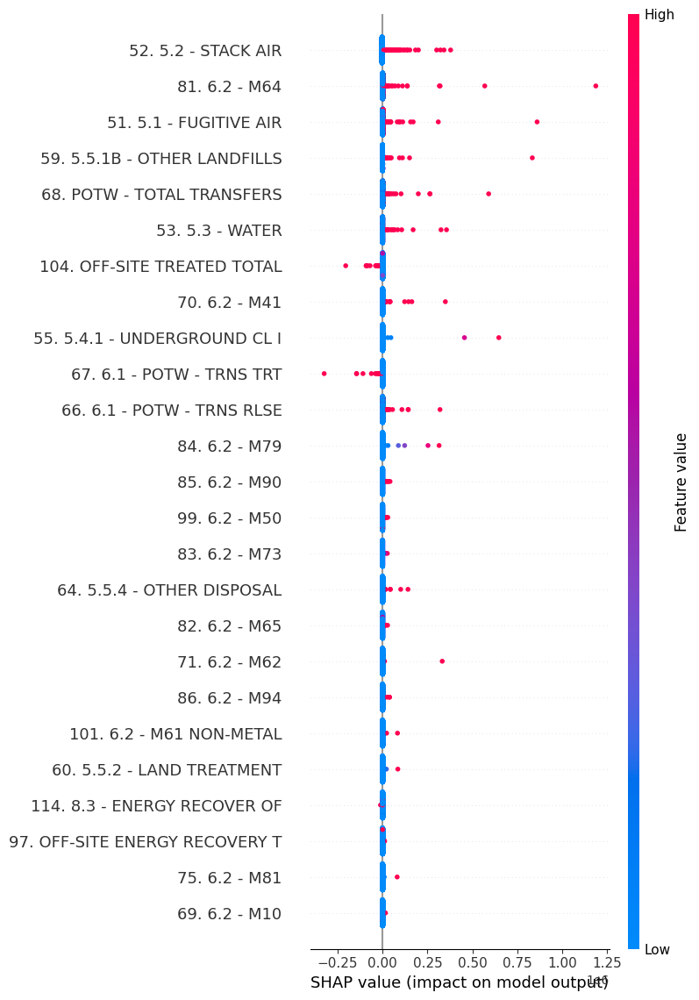

In [ ]:
# Visualize SHAP values
shap.summary_plot(shap_values_, X_test1_scaled, feature_names=feature_names, max_display=25)

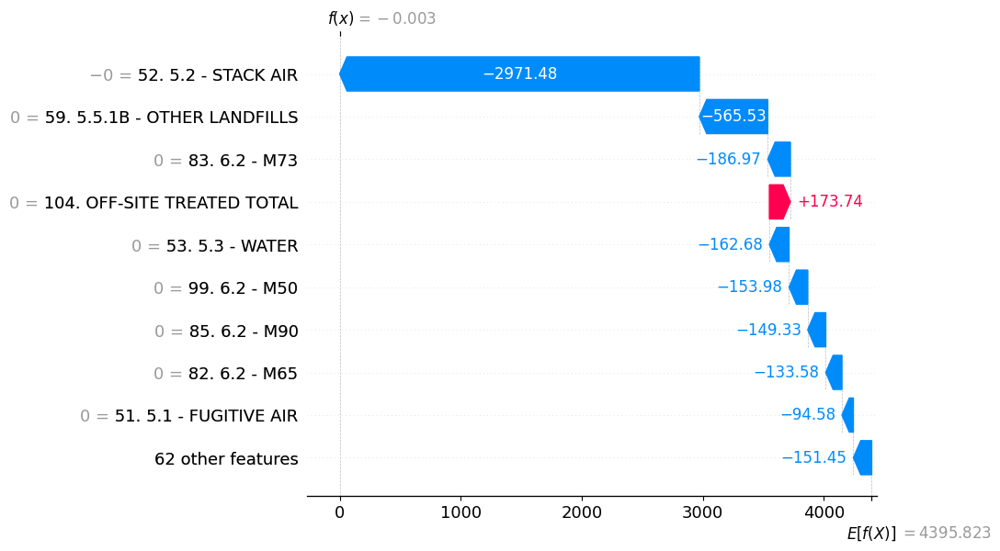

In [ ]:
shap.plots.waterfall(shap_values[0])

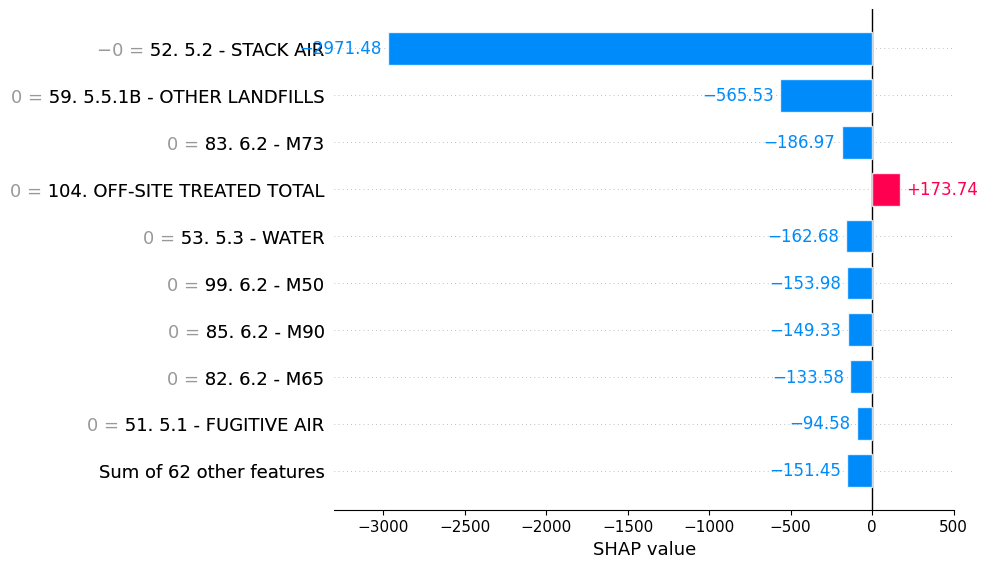

In [ ]:
shap.plots.bar(shap_values[0])

## Simpan Model

In [ ]:
# Simpan model Ridge Regression
import pickle

with open("model.pkl", "wb") as model_file:
    pickle.dump(model, model_file)

# Simulasi: Sistem Kebijakan

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import pandas as pd
import pickle

with open("model.pkl", "rb") as model_file:
    model = pickle.load(model_file)

# Semua fitur dari dataset
all_features = [
    "2. TRIFD", "7. COUNTY", "8. ST", "12. LATITUDE", "13. LONGITUDE", "21. FEDERAL FACILITY", "23. INDUSTRY SECTOR",
    "43. CLASSIFICATION", "44. METAL", "45. METAL CATEGORY", "46. CARCINOGEN", "47. PBT", "48. PFAS", "49. FORM TYPE",
    "50. UNIT OF MEASURE", "51. 5.1 - FUGITIVE AIR", "52. 5.2 - STACK AIR", "53. 5.3 - WATER",
    "55. 5.4.1 - UNDERGROUND CL I", "56. 5.4.2 - UNDERGROUND C II-V", "58. 5.5.1A - RCRA C LANDFILL",
    "59. 5.5.1B - OTHER LANDFILLS", "60. 5.5.2 - LAND TREATMENT", "62. 5.5.3A - RCRA SURFACE IM",
    "63. 5.5.3B - OTHER SURFACE I", "64. 5.5.4 - OTHER DISPOSAL", "66. 6.1 - POTW - TRNS RLSE",
    "67. 6.1 - POTW - TRNS TRT", "68. POTW - TOTAL TRANSFERS", "69. 6.2 - M10", "70. 6.2 - M41",
    "71. 6.2 - M62", "75. 6.2 - M81", "76. 6.2 - M82", "79. 6.2 - M66", "80. 6.2 - M67", "81. 6.2 - M64",
    "82. 6.2 - M65", "83. 6.2 - M73", "84. 6.2 - M79", "85. 6.2 - M90", "86. 6.2 - M94", "87. 6.2 - M99",
    "94. OFF-SITE RECYCLED TOTAL", "97. OFF-SITE ENERGY RECOVERY T", "98. 6.2 - M40 NON-METAL",
    "99. 6.2 - M50", "100. 6.2 - M54", "101. 6.2 - M61 NON-METAL", "102. 6.2 - M69", "103. 6.2 - M95",
    "104. OFF-SITE TREATED TOTAL", "106. 6.2 - TOTAL TRANSFER", "109. 8.1A - ON-SITE CONTAINED",
    "110. 8.1B - ON-SITE OTHER", "111. 8.1C - OFF-SITE CONTAIN", "112. 8.1D - OFF-SITE OTHER R",
    "113. 8.2 - ENERGY RECOVER ON", "114. 8.3 - ENERGY RECOVER OF", "115. 8.4 - RECYCLING ON SITE",
    "116. 8.5 - RECYCLING OFF SIT", "117. 8.6 - TREATMENT ON SITE", "118. 8.7 - TREATMENT OFF SITE",
    "119. PRODUCTION WSTE (8.1-8.7)", "121. PROD_RATIO_OR_ ACTIVITY", "122. 8.9 - PRODUCTION RATIO",
    "Region", "Distance_From_Center", "Environmental_Risk_Score", "Recycling_Efficiency", "Treatment_Efficiency"
]

# Fitur dengan dampak tinggi
high_impact_features = ["52. 5.2 - STACK AIR", "51. 5.1 - FUGITIVE AIR", "59. 5.5.1B - OTHER LANDFILLS"]

# Baseline values untuk semua fitur
baseline_values = {feature: 0 for feature in all_features}
baseline_values.update({
    "52. 5.2 - STACK AIR": 48.35481988862153,
    "51. 5.1 - FUGITIVE AIR": 122.48590748889448,
    "59. 5.5.1B - OTHER LANDFILLS": 1266.3896898415892
})

def create_prediction_dashboard():
    # Widget untuk fitur numerik dengan dampak tinggi
    sliders = {
        feature: widgets.FloatSlider(
            min=-50, max=50, value=0, step=1,
            description=feature,
            style={'description_width': '400px'},  # Lebar deskripsi lebih besar
            layout=widgets.Layout(width='90%')    # Lebar slider lebih besar
        ) for feature in high_impact_features
    }

    prediction_output = widgets.Output()

    def make_prediction(change=None):
        with prediction_output:
            clear_output()

            simulation_data = baseline_values.copy()

            for feature, slider in sliders.items():
                change = slider.value / 100
                simulation_data[feature] *= (1 + change)

            simulation_df = pd.DataFrame([simulation_data])[all_features]

            # Prediksi menggunakan model
            prediction = model.predict(simulation_df)[0]
            print(f"Prediksi Total Releases: {prediction:.2f}")
            print("\nDetail Perubahan Fitur:")
            for feature, value in simulation_data.items():
                print(f"- {feature}: {value}")

    # Sambungkan widget dengan fungsi prediksi
    for slider in sliders.values():
        slider.observe(make_prediction, 'value')

    # Catatan untuk dashboard
    dashboard_notes = widgets.HTML("""
        <h4>Petunjuk Penggunaan Dashboard:</h4>
        <ul>
            <li>Atur nilai perubahan fitur menggunakan slider untuk fitur <b>dampak tinggi</b>.</li>
            <li>Perubahan fitur dihitung dalam bentuk persentase (%).</li>
            <li>Klik atau geser slider untuk melihat perubahan prediksi <b>Total Releases</b>.</li>
            <li>Fitur yang tidak diubah akan menggunakan nilai baseline.</li>
        </ul>
        <h5>Contoh:</h5>
        <ul>
            <li><b>52. 5.2 - STACK AIR</b>: Tingkatkan nilai sebanyak 10%, maka prediksi akan menyesuaikan.</li>
            <li><b>51. 5.1 - FUGITIVE AIR</b>: Kurangi nilai sebanyak 20%, maka hasil prediksi juga berubah.</li>
        </ul>
        <p>Dashboard ini dapat dikembangkan dengan menambahkan lebih banyak fitur atau grafik visualisasi.</p>
    """)

    dashboard = widgets.VBox([
        widgets.HTML("<h2 style='color: #2E86C1'>Dashboard Prediksi Total Limbah Berbahaya</h2>"),
        dashboard_notes,
        widgets.HTML("<h3>Fitur yang Dapat Diubah:</h3>"),
        *sliders.values(),
        widgets.HTML("<h3>Hasil Prediksi:</h3>"),
        prediction_output
    ])

    display(dashboard)
    make_prediction()

# Jalankan dashboard
create_prediction_dashboard()

---

**1. "52. 5.2 - STACK AIR"**
- **Arti Umum**:
  - **Stack Air** mengacu pada emisi udara dari cerobong asap (stacks) di fasilitas industri.
- **Konteks**:
  - Merupakan sumber emisi udara terkontrol di mana polutan dilepaskan ke atmosfer melalui cerobong yang dirancang untuk mengurangi dampak terhadap lingkungan.
- **Indikator**:
  - Biasanya diukur dalam satuan konsentrasi seperti **µg/m³** (mikrogram per meter kubik) atau massa total emisi per waktu tertentu.
- **Pentingnya**:
  - Fitur ini mencerminkan tingkat polusi udara yang berasal dari proses industri yang dilepaskan melalui cerobong asap.
  - Tingginya nilai menunjukkan kontribusi signifikan terhadap pencemaran udara.

---

 **2. "51. 5.1 - FUGITIVE AIR"**
- **Arti Umum**:
  - **Fugitive Air** mengacu pada emisi udara yang tidak terkendali atau tidak dilepaskan melalui saluran atau cerobong tertentu.
- **Konteks**:
  - Sumbernya bisa berasal dari kebocoran peralatan, proses manufaktur, penyimpanan bahan baku, atau aktivitas lainnya yang tidak melalui saluran terkontrol.
- **Indikator**:
  - Juga diukur dalam satuan konsentrasi atau massa total emisi.
- **Pentingnya**:
  - Fitur ini mencerminkan tingkat polusi udara yang tidak terkendali.
  - Biasanya lebih sulit dikelola dibandingkan **Stack Air** karena sumbernya tersebar (diffuse).
  - Nilai tinggi menunjukkan adanya kebocoran atau pengelolaan yang kurang efektif terhadap sumber emisi.

---

 **3. "59. 5.5.1B - OTHER LANDFILLS"**
- **Arti Umum**:
  - **Other Landfills** mengacu pada limbah yang dibuang ke tempat pembuangan sampah (landfill) yang tidak termasuk dalam kategori standar seperti fasilitas yang memenuhi persyaratan **RCRA (Resource Conservation and Recovery Act)**.
- **Konteks**:
  - Tempat pembuangan ini biasanya digunakan untuk limbah yang tidak memenuhi standar tertentu atau yang dikelola dengan cara berbeda.
  - Dapat mencakup limbah domestik, industri, atau limbah berbahaya.
- **Indikator**:
  - Diukur berdasarkan volume limbah atau berat total (misalnya, ton per tahun).
- **Pentingnya**:
  - Fitur ini mencerminkan kontribusi limbah terhadap pencemaran tanah, air, atau emisi gas rumah kaca dari dekomposisi limbah.
  - Nilai tinggi menunjukkan bahwa fasilitas tersebut membuang banyak limbah ke landfill, yang dapat berdampak negatif pada lingkungan jika tidak dikelola dengan baik.

---

 **Mengapa Penting dalam Model?**
Ketiga fitur ini penting karena mereka berhubungan langsung dengan emisi dan limbah, yang merupakan indikator utama untuk:

1. **Kesehatan Lingkungan**:
   - Polusi udara dan pembuangan limbah memiliki dampak besar pada kualitas udara, air, dan tanah.

2. **Regulasi dan Kepatuhan**:
   - Data ini sering digunakan untuk mengevaluasi kepatuhan terhadap peraturan lingkungan, seperti standar emisi atau pengelolaan limbah.

3. **Dampak Ekonomi**:
   - Pengelolaan limbah dan emisi udara yang buruk dapat menyebabkan biaya tambahan bagi perusahaan (denda, litigasi, dll.) dan dampak negatif pada masyarakat.

4. **Prediksi Total Releases**:
   - Ketiga fitur ini merupakan bagian dari input model karena memberikan kontribusi besar dalam menghitung prediksi **Total Releases**, yang mencakup semua emisi dan pembuangan limbah dari fasilitas tertentu.

---
